# **Marketing Campaign Analysis**

## **Problem Definition**

### **The Context:**

 - Why is this problem important to solve?

### **The objective:**

 - What is the intended goal?

### **The key questions:**

- What are the key questions that need to be answered?

### **The problem formulation**:

- What is it that we are trying to solve using data science?

------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [1]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.2 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn_extra.cluster import KMedoids

In [3]:
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist

In [4]:
import sys

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
#mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
#create file path
path="/content/drive/MyDrive/MIT_Data_Science/marketing_campaign+%284%29.csv"

In [8]:
# read the data
df = pd.read_csv(path)
# returns the first 5 rows
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0


## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for missing values
- Checking for duplicated values
- Drop the column which has no null values

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [10]:
df.drop(columns="ID", inplace=True)

#### **Observations and Insights from the Data overview:**
There are 27 columns of data and 2240 entries. Income has 2216 non-null entries, indicating missing data. Dt_Customer will have to be converted to date time type. ID will not affect analysis and has been dropped.

## **Exploratory Data Analysis (EDA)**


- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?
4. There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

In [11]:
df.describe()

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,...,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.012946,0.009375,0.149107
std,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,...,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.113069,0.096391,0.356274
min,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,...,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,...,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,...,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,...,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
# List of the categorical columns in the data
cols = ["Education", "Marital_Status", "Kidhome", "Teenhome", "Complain"]

In [13]:
for column in cols:
    print("Unique values in", column, "are :")
    print(df[column].unique())
    print("*" * 50)

Unique values in Education are :
['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
**************************************************
Unique values in Marital_Status are :
['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
**************************************************
Unique values in Kidhome are :
[0 1 2]
**************************************************
Unique values in Teenhome are :
[0 1 2]
**************************************************
Unique values in Complain are :
[0 1]
**************************************************


* There are 5 categories in education, 2n Cycle seems to be the same as Master and can be combined, Basic seems to be the same as Graduation and can be combined.
* There are 8 categories in Marital Staus. Single, divorced, widow, absurd, YOLO and alone can be combined into one category. Married and together can be combined into one category.
* The minimum year of birth is 1893, which seems like an error in the data input, and will have to be corrected.
* The minimum income is 1,730, the maximum is 666,666, the mean is 52,247, the median is 51,381. There seem to be some extreme outliers on the high end of this data, as 75% is 68,522.
* Kids at home and teens at home both have a minimum of 0 and a maximum of 2, these can be categorical values.
* Recency has a minimum of 0 and a maximum of 99, with a mean of 49 and a median of 49, indicating low skew of data.
* There are several categories of amount purchased in last 2 years, that should be combined for a total amount spent.
* There are several categories of Number of purchases through different methods that should be combined for a total number of purchases.
* There are several columns for when a customer accepted a campaign. These could be combined for a yes/ no and become a categorical column.
* Complain has a minimum of 0 and a maximum of 1, with a mean of 0.009 and a 75% of 0, indicating that most customers do not complain and this column can likely be dropped. Since there are only 2 values in this column it will be categorical.

In [14]:
#replace 2n with Master
df["Education"].replace("2n Cycle", "Master",inplace=True)

In [15]:
#replace YOLO alone and absurd with single
df["Marital_Status"].replace("YOLO", "Single", inplace=True)
df["Marital_Status"].replace("Absurd", "Single", inplace=True)
df["Marital_Status"].replace("Alone", "Single", inplace=True)

### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

- Plot histogram and box plot for different numerical features and understand how the data looks like.
- Explore the categorical variables like Education, Kidhome, Teenhome, Complain.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. How does the distribution of Income variable vary across the dataset?
2. The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?
3. There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?


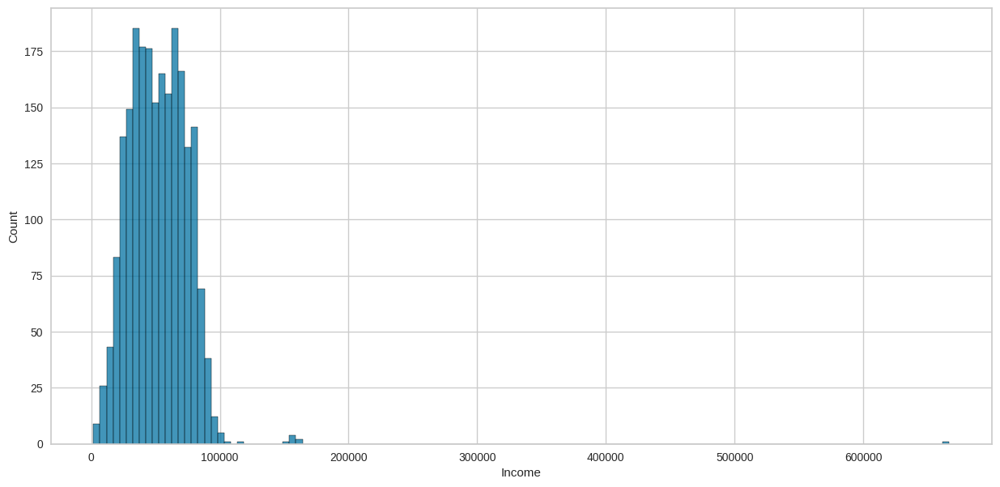

In [16]:
#Histplot of Income
plt.figure(figsize=(15, 7))
sns.histplot(x="Income", data=df)
plt.show()

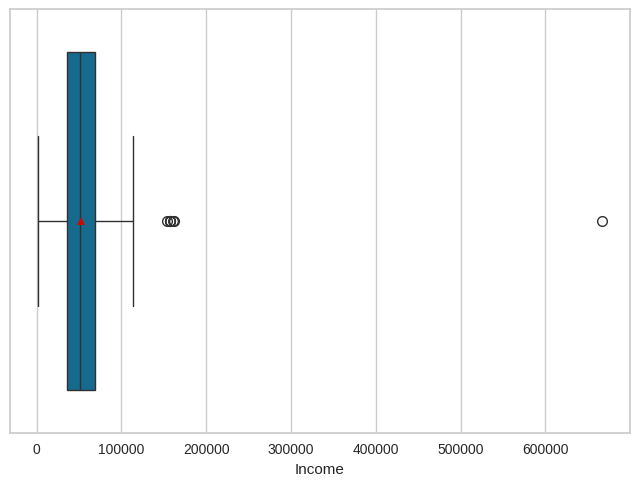

In [17]:
#Boxplot of Income
sns.boxplot(data=df, x="Income", showmeans=True)
plt.show()

In [18]:
# Calculating upper whisker for Income

Q1 = df.quantile(q=0.25)

Q3 = df.quantile(q=0.75)

IQR = Q3-Q1

upper_whisker = (Q3 + 1.5 * IQR)["Income"]

print(upper_whisker)

118350.5


In [19]:
# Observations of extreme values for Income
df[df.Income > upper_whisker]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
164,1973,PhD,Married,157243.0,0,1,01-03-2014,98,20,2,...,22,0,0,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,03-06-2013,31,85,1,...,0,1,1,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,07-02-2014,81,1,1,...,0,0,0,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,04-08-2012,21,55,16,...,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,04-06-2013,37,39,1,...,0,1,1,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,29-04-2013,13,1,0,...,28,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,29-08-2013,85,2,1,...,0,0,0,0,0,0,0,0,0,0
2233,1977,Graduation,Together,666666.0,1,0,02-06-2013,23,9,14,...,1,3,6,0,0,0,0,0,0,0


In [20]:
# 99.5% percentile for Income
df.quantile(q=0.995)["Income"]

102145.75000000003

In [21]:
# Dropping outliers
df.drop(index=[164, 617, 655, 687, 1300, 1653, 2132, 2233], inplace=True)

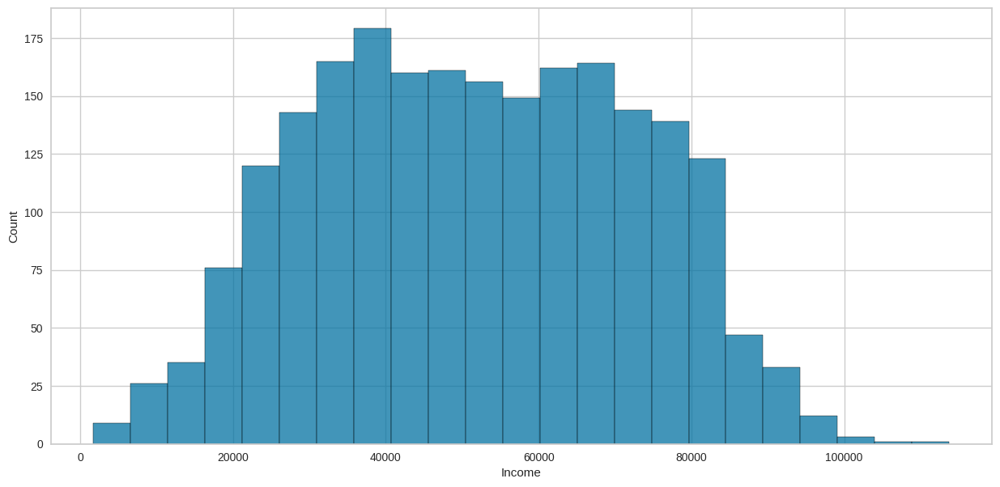

In [22]:
#Income histplot outliers removed
plt.figure(figsize=(15, 7))
sns.histplot(x="Income", data=df)
plt.show()

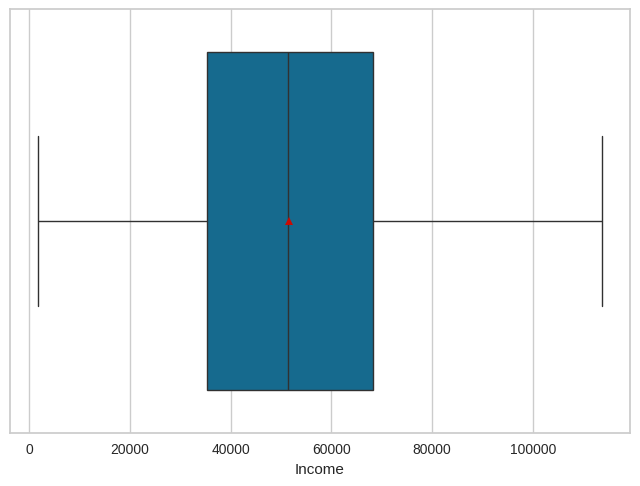

In [23]:
#Income boxplot outliers removed
sns.boxplot(data=df, x="Income", showmeans=True)
plt.show()

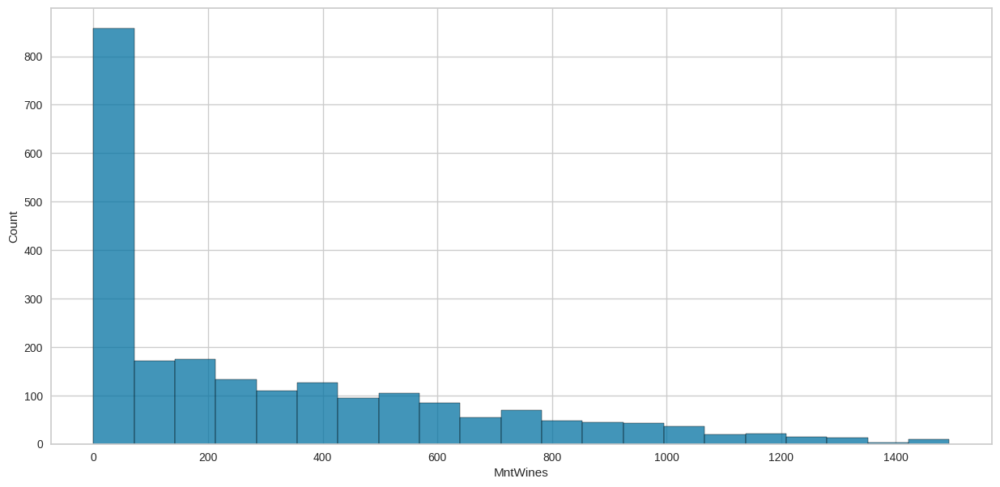

In [24]:
#histplot mntwines
plt.figure(figsize=(15, 7))
sns.histplot(x='MntWines', data=df)
plt.show()

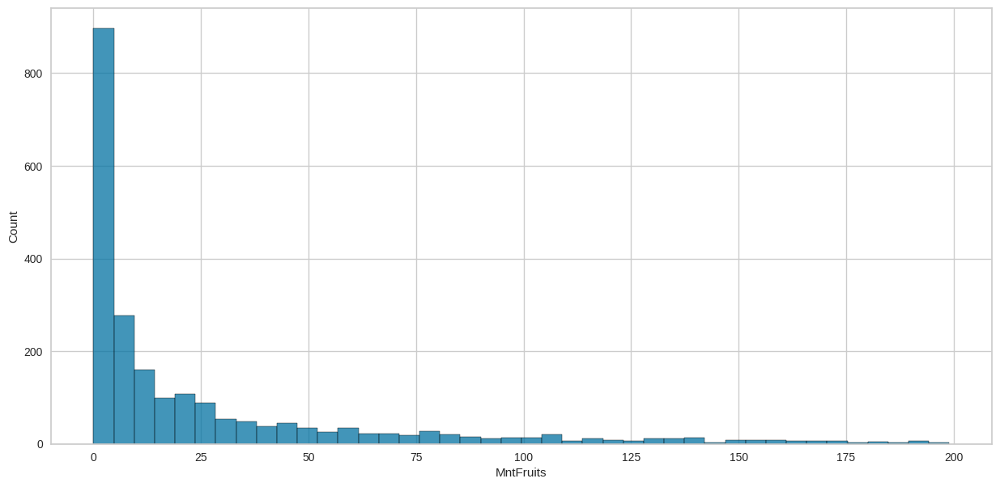

In [25]:
#histplot mntfruits
plt.figure(figsize=(15, 7))
sns.histplot(x='MntFruits', data=df)
plt.show()

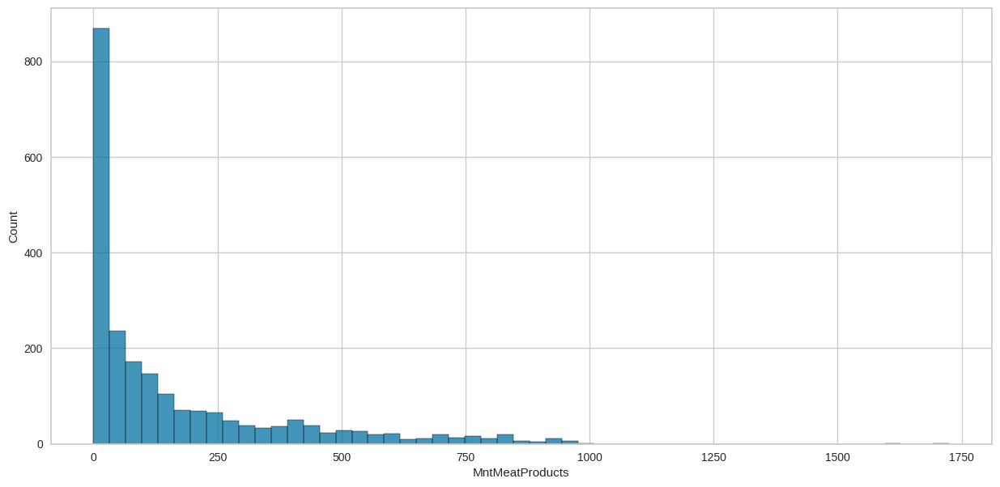

In [26]:
#histplot mntmeatproducts
plt.figure(figsize=(15, 7))
sns.histplot(x='MntMeatProducts', data=df)
plt.show()

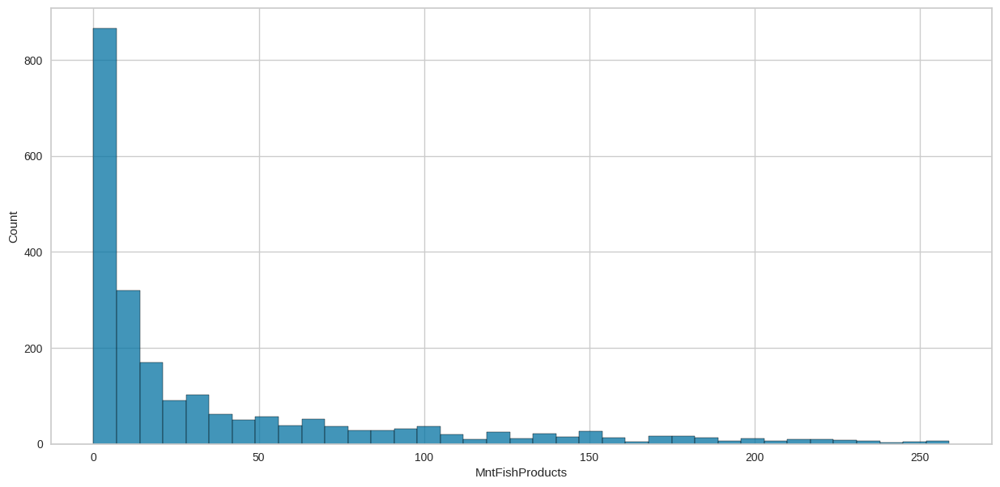

In [27]:
#histplot mntfishproducts
plt.figure(figsize=(15, 7))
sns.histplot(x='MntFishProducts', data=df)
plt.show()

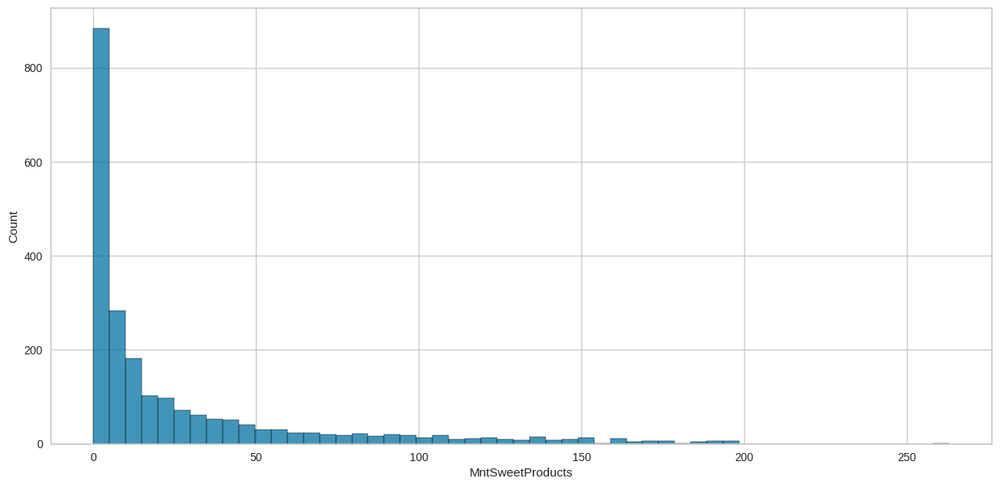

In [28]:
#histplot mntsweetproducts
plt.figure(figsize=(15, 7))
sns.histplot(x='MntSweetProducts', data=df)
plt.show()

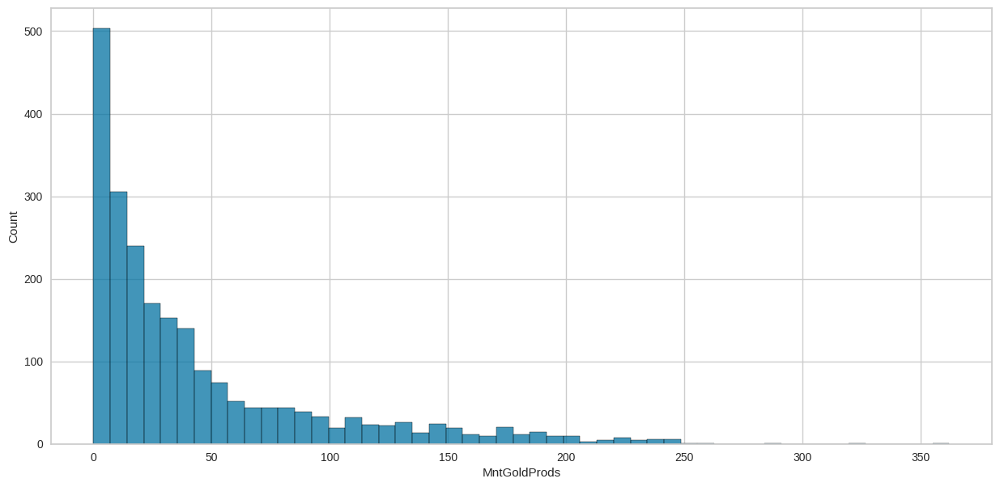

In [29]:
#histplot mntgoldprods
plt.figure(figsize=(15, 7))
sns.histplot(x='MntGoldProds', data=df)
plt.show()

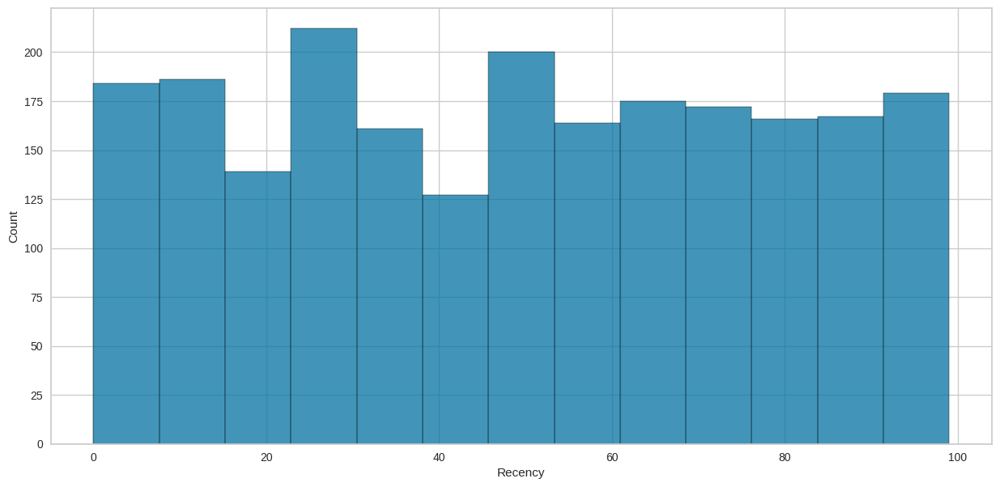

In [30]:
#histplot recency
plt.figure(figsize=(15, 7))
sns.histplot(x='Recency', data=df)
plt.show()

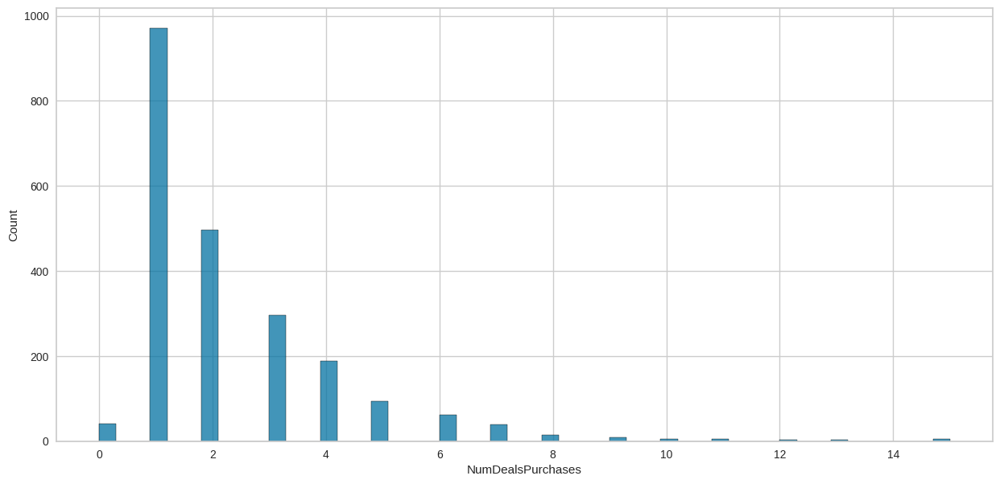

In [31]:
#histplot numdealspurchases
plt.figure(figsize=(15, 7))
sns.histplot(x='NumDealsPurchases', data=df)
plt.show()

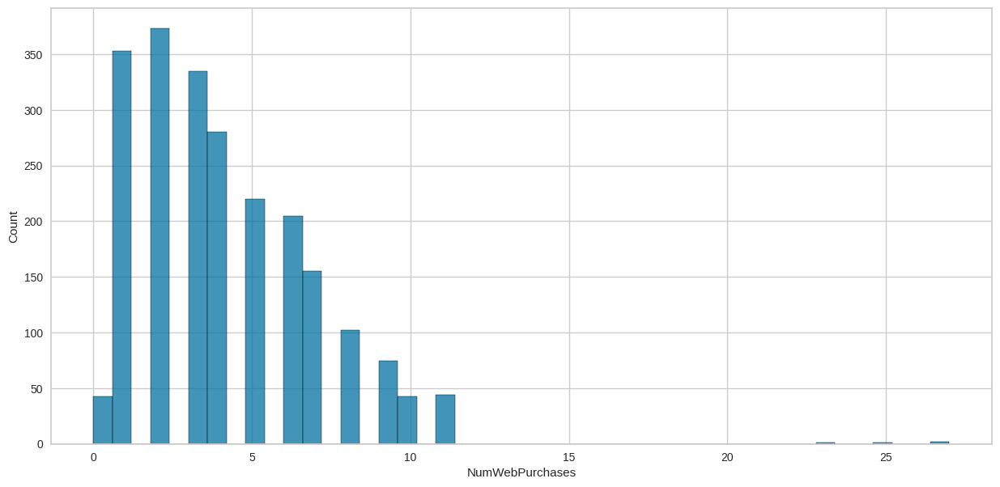

In [32]:
#histplot numwebpurchases
plt.figure(figsize=(15, 7))
sns.histplot(x='NumWebPurchases', data=df)
plt.show()

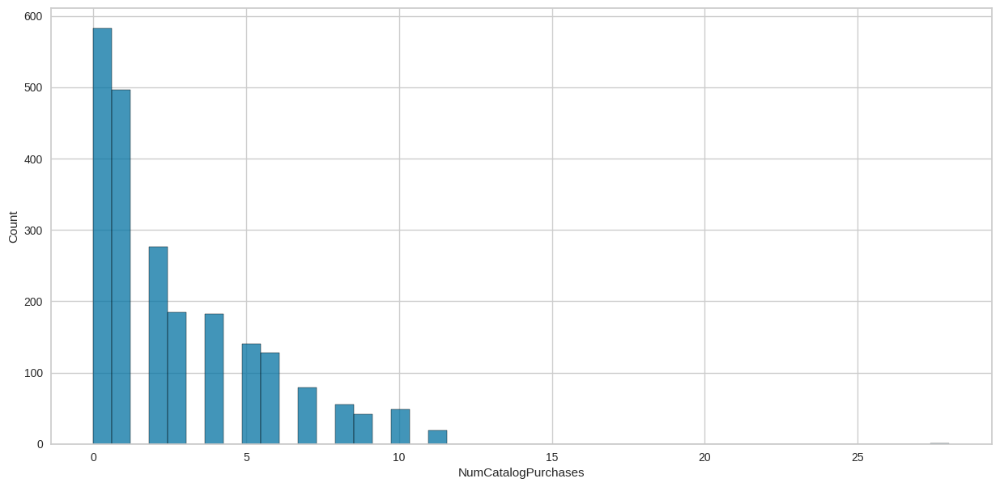

In [33]:
#histplot numcatalogpurchases
plt.figure(figsize=(15, 7))
sns.histplot(x='NumCatalogPurchases', data=df)
plt.show()

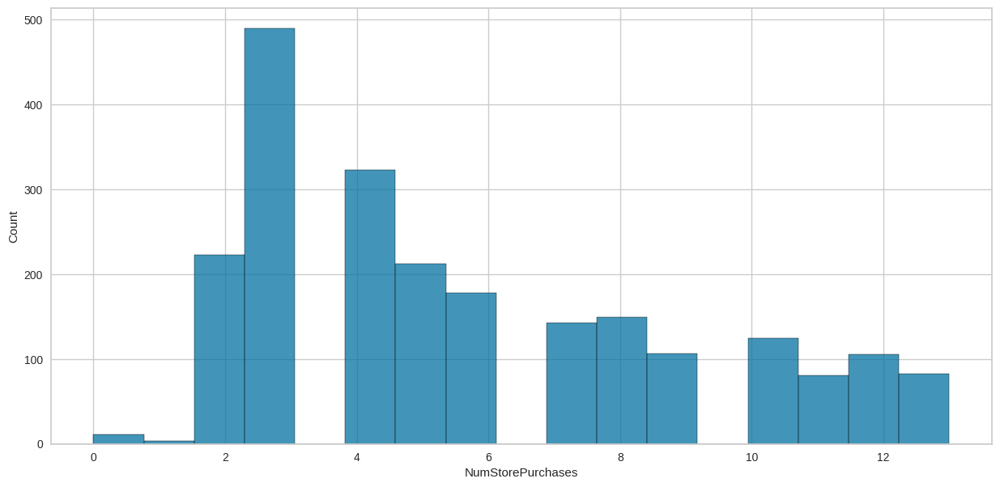

In [34]:
#hisplotnumstorepurchases
plt.figure(figsize=(15, 7))
sns.histplot(x='NumStorePurchases', data=df)
plt.show()

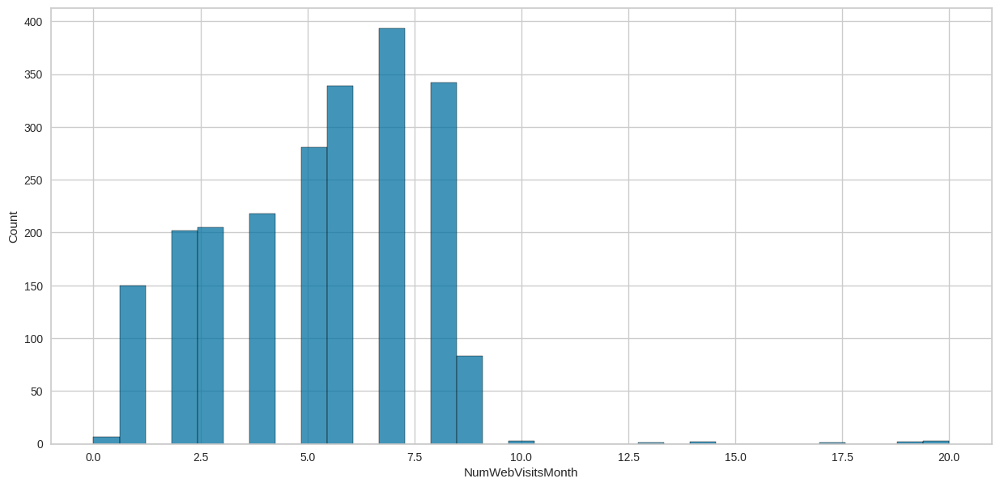

In [35]:
#histplot numwebvisitsmonth
plt.figure(figsize=(15, 7))
sns.histplot(x='NumWebVisitsMonth', data=df)
plt.show()

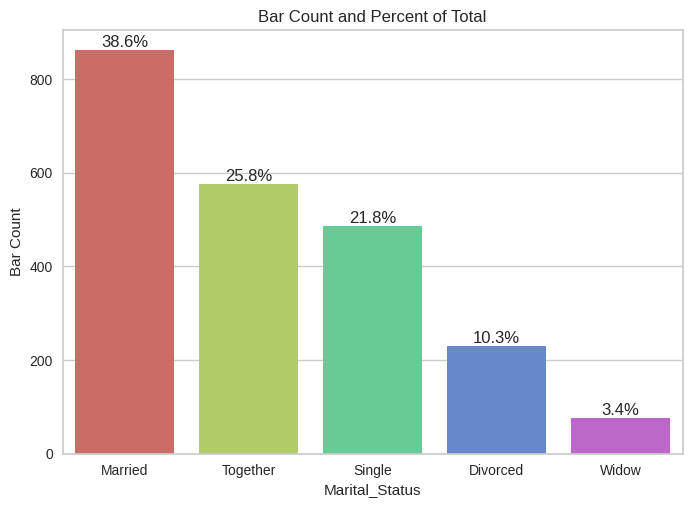

In [36]:
#countplot with percent for marital status
ax = sns.countplot(x="Marital_Status", data=df, order = df["Marital_Status"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

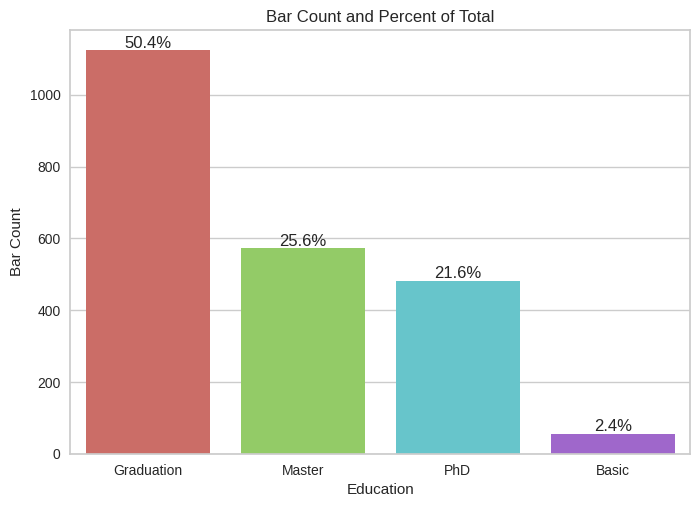

In [37]:
#countplot with percent for education
ax = sns.countplot(x="Education", data=df, order = df["Education"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

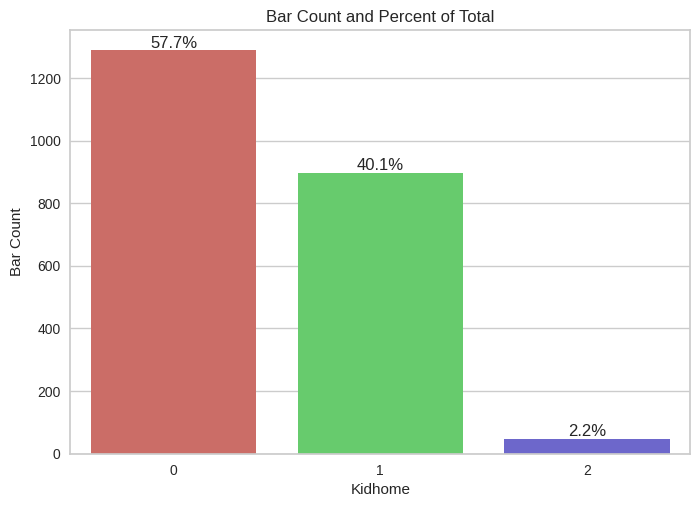

In [38]:
#countplot with percent for Kidhome
ax = sns.countplot(x="Kidhome", data=df, order = df["Kidhome"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

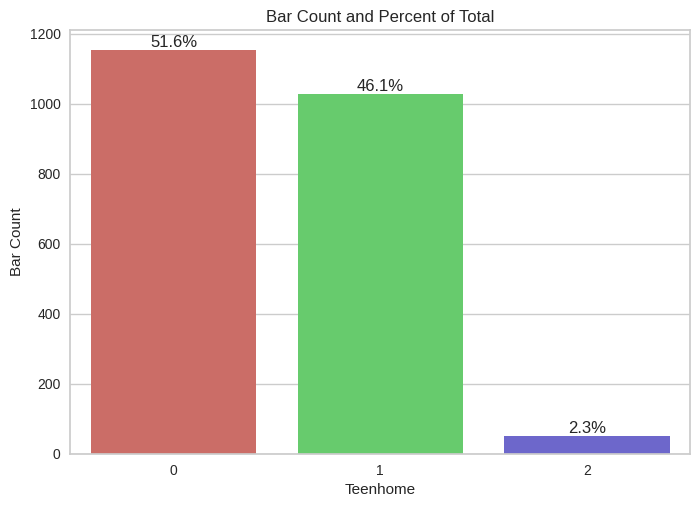

In [39]:
#countplot with percent for Teenhome
ax = sns.countplot(x="Teenhome", data=df, order = df["Teenhome"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

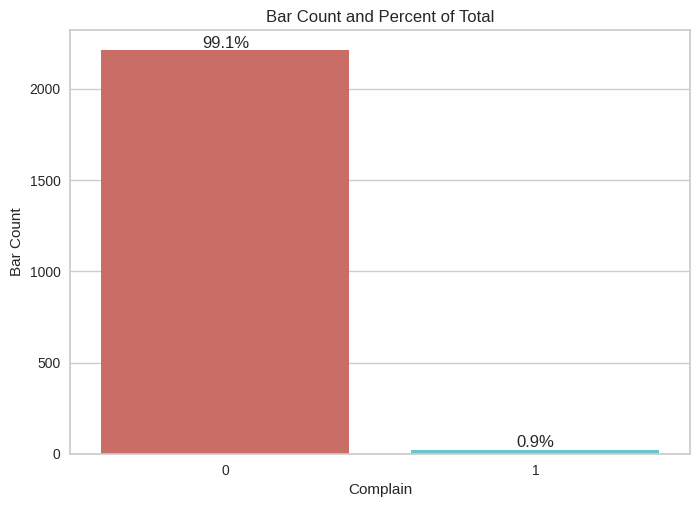

In [40]:
#countplot with percent for complain
ax = sns.countplot(x="Complain", data=df, order = df["Complain"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

**Observations:**
* Income is evenly distributed after dropping outliers above the 99.5 percentile. The median  is around 55,000.
* Mntwines, mntfruits, mntmeatproducts, mntfishproducts, mntsweetproducts, and mntgoldprods are all very skewed to the right.
* Recency is uniformly distributed from 0-99 days.
* NumDealsPurchases, NumWebPurchases, NumCatalogPurchases, and NumStorePurchases are all skewed to the right, most being under 10.
* NumWebVisitsMonth is evenly distributed, with some outliers over 10.
* Most customers are married (38.6%), followed by together (25.8%), single (21.8%), divorced (10.3%), then widow (3.4%).
* Most customers have graduated (50.4%), followed by masters (25.6%), PhD (21.6%), then basic (2.4%).
* Most customers have 0 kids (57.7%), followed by 1 (40.1%), then 2 (2.2%).
* Most customers have 0 teenagers (51.6%), followed by 1 (46.1%), then 2 (2.3%).
* Most customers have never complained (99.1%).


### **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

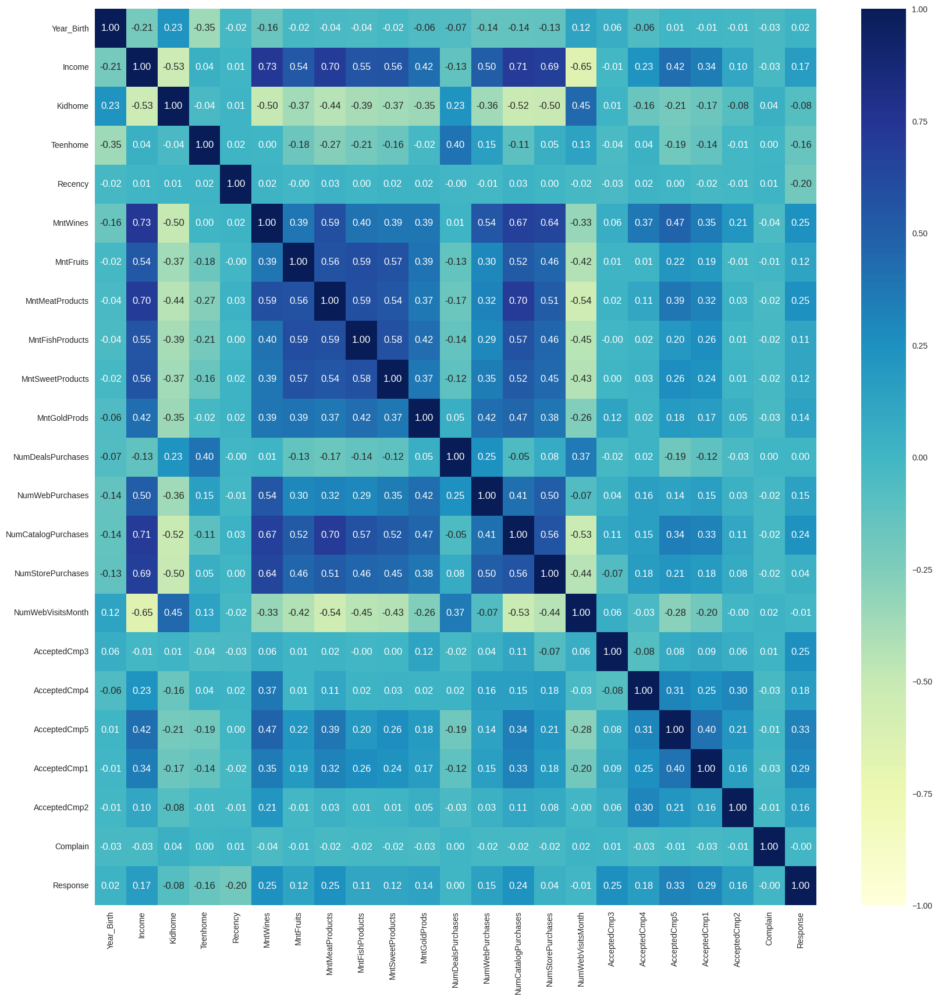

In [41]:
#heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt="0.2f", cmap="YlGnBu")
plt.show()

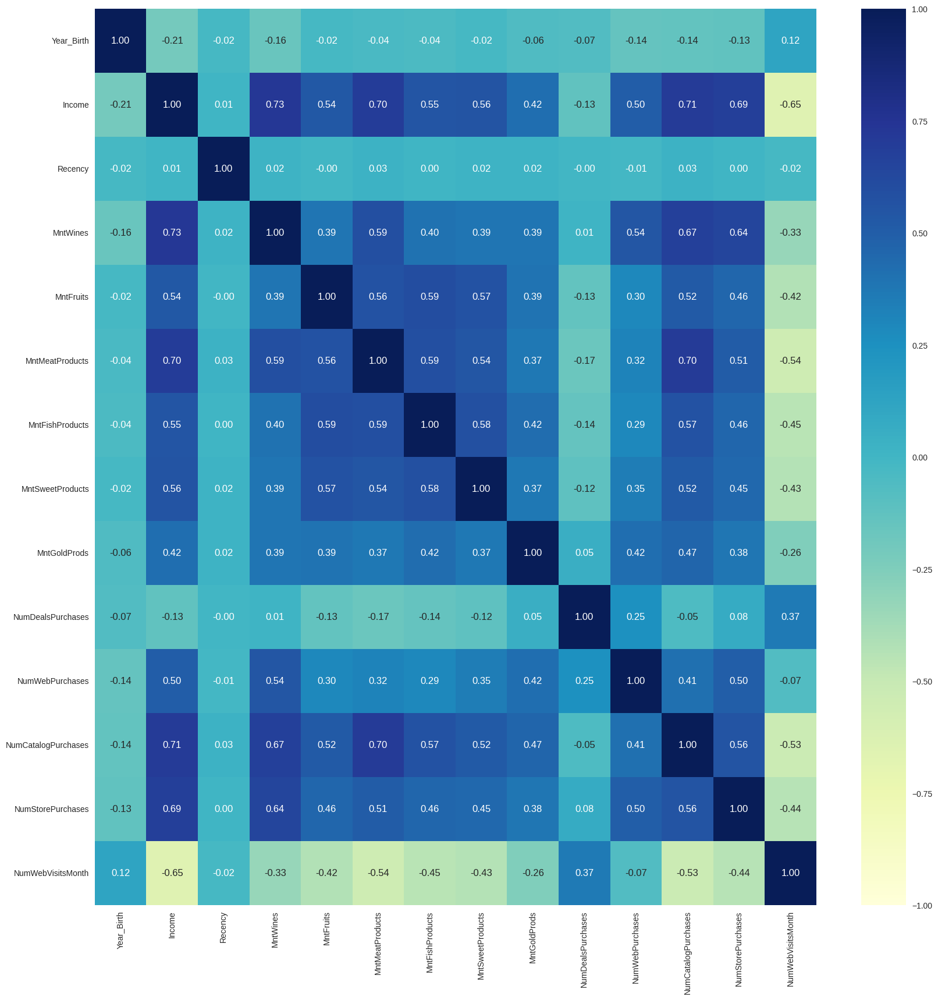

In [42]:
#heatmap with less categories
plt.figure(figsize=(20,20))
sns.heatmap(df[["Year_Birth",	"Income",	"Recency",	"MntWines",	"MntFruits", "MntMeatProducts", "MntFishProducts" , "MntSweetProducts" , "MntGoldProds",
 "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases",	"NumStorePurchases",	"NumWebVisitsMonth"]].corr(), annot=True, vmin=-1, vmax=1, fmt="0.2f", cmap="YlGnBu")
plt.show()

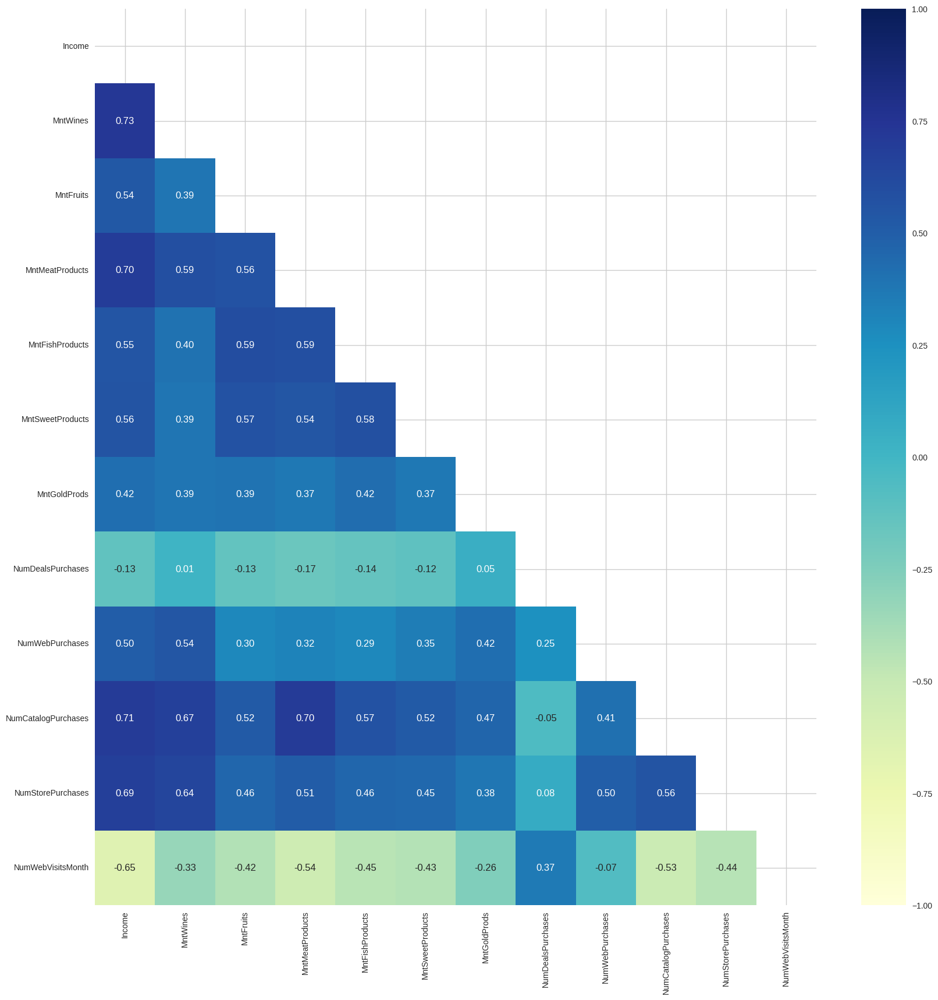

In [43]:
#heatmap with minimal categories
corrdf=df[["Income",	"MntWines",	"MntFruits", "MntMeatProducts", "MntFishProducts" , "MntSweetProducts" , "MntGoldProds",
 "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases",	"NumStorePurchases",	"NumWebVisitsMonth"]]
mask = np.triu(np.ones_like(corrdf.corr(), dtype=bool))
plt.figure(figsize=(20,20))
sns.heatmap(df[["Income",	"MntWines",	"MntFruits", "MntMeatProducts", "MntFishProducts" , "MntSweetProducts" , "MntGoldProds",
 "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases",	"NumStorePurchases",	"NumWebVisitsMonth"]].corr(), annot=True, mask=mask,vmin=-1, vmax=1, fmt="0.2f", cmap="YlGnBu")

plt.show()

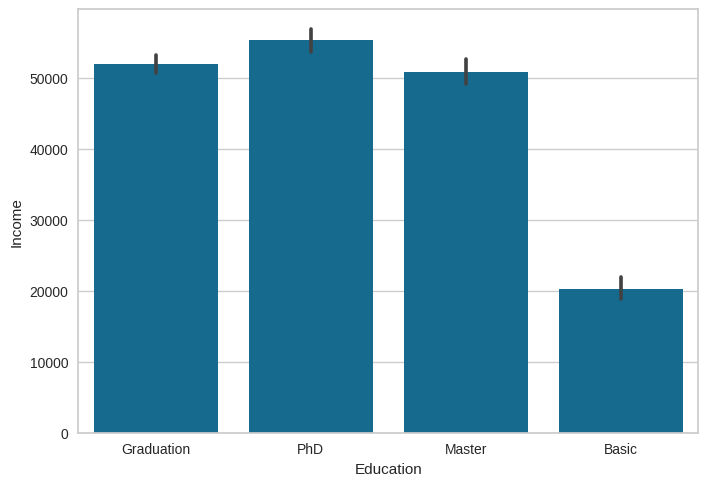

In [44]:
#plot education v income
sns.barplot(x="Education", y="Income", data=df)
plt.show()

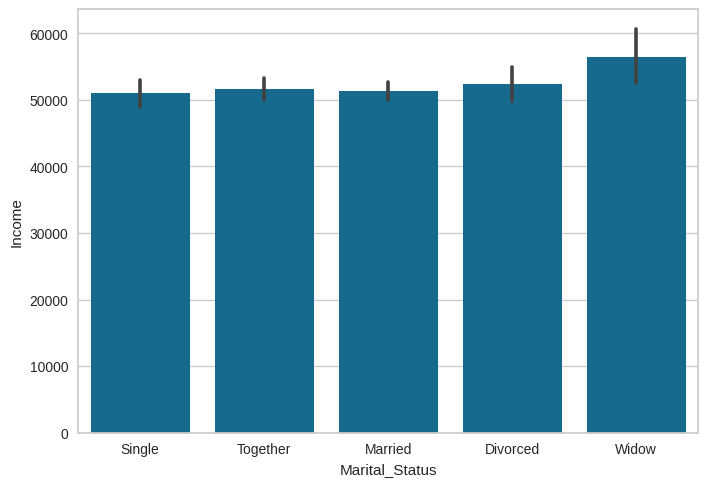

In [45]:
#plot marital status v income
sns.barplot(x="Marital_Status", y="Income", data=df)
plt.show()

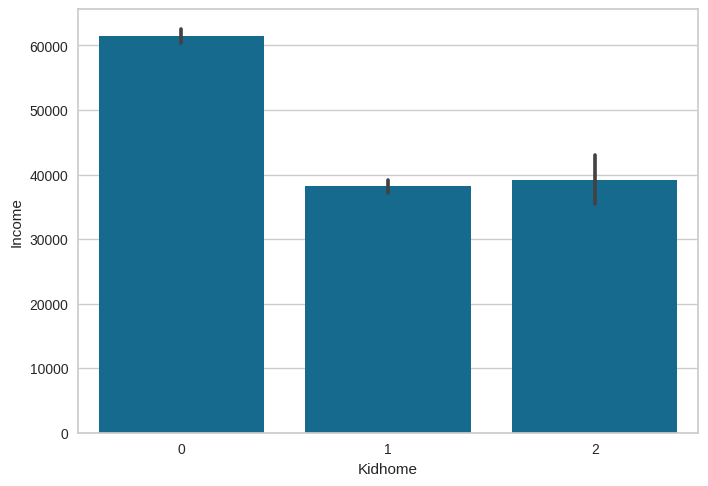

In [46]:
#plot kidhome v income
sns.barplot(x="Kidhome", y="Income", data=df)
plt.show()

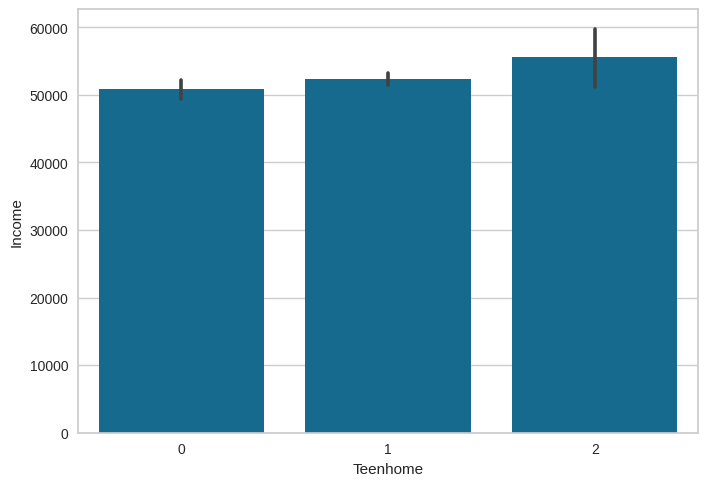

In [47]:
#plot teenhome v income
sns.barplot(x="Teenhome", y="Income", data=df)
plt.show()

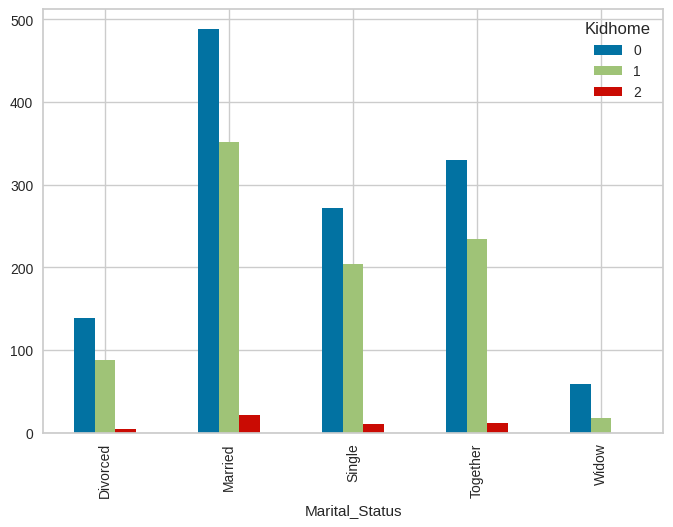

In [48]:
#plot marital status v kidhome
pd.crosstab(df["Marital_Status"],df["Kidhome"]).plot(kind="bar" ,stacked=False)
plt.show()

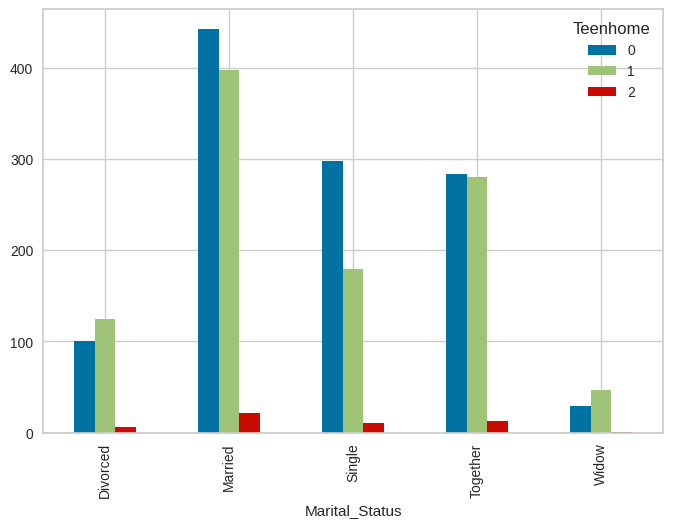

In [49]:
#plot marital status v teenhome
pd.crosstab(df["Marital_Status"],df["Teenhome"]).plot(kind="bar" ,stacked=False)
plt.show()

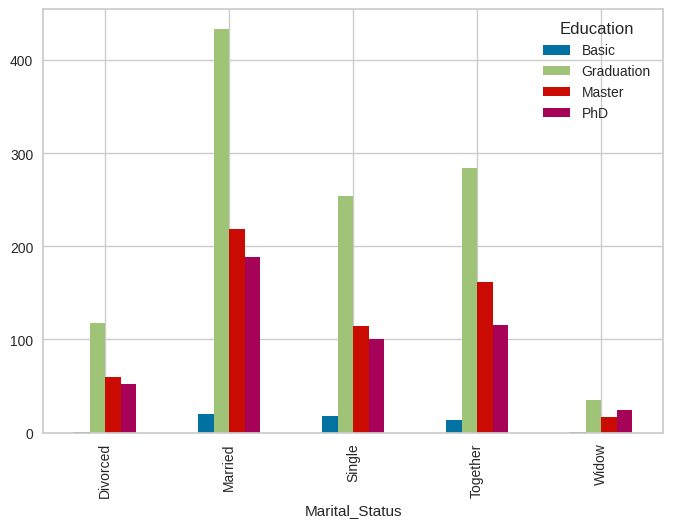

In [50]:
#plot marital status v education
pd.crosstab(df["Marital_Status"],df["Education"]).plot(kind="bar" ,stacked=False)
plt.show()

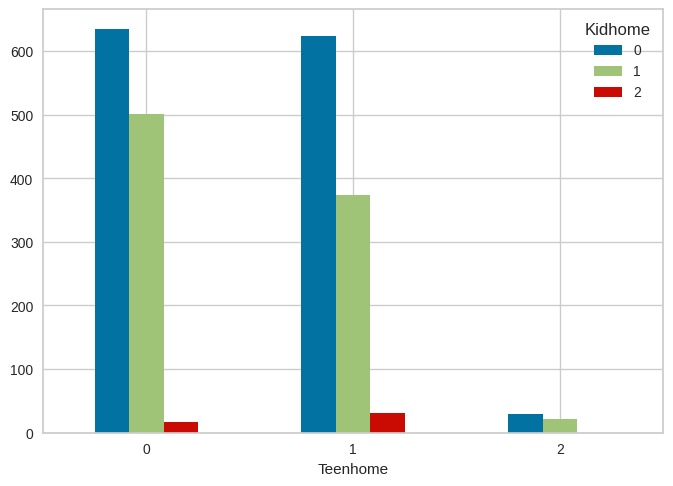

In [51]:
#plot teenhome v kidhome
pd.crosstab(df["Teenhome"],df["Kidhome"]).plot(kind="bar" ,stacked=False)
plt.xticks(rotation=0)
plt.show()

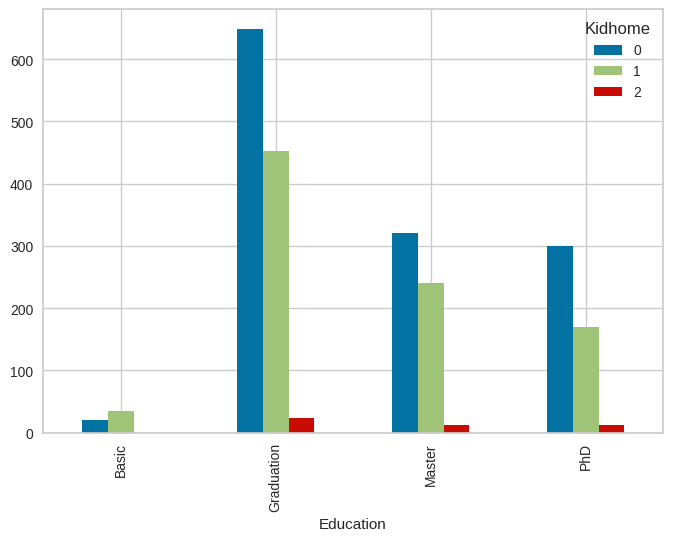

In [52]:
#plot education v kidhome
pd.crosstab(df["Education"],df["Kidhome"]).plot(kind="bar" ,stacked=False)
plt.show()

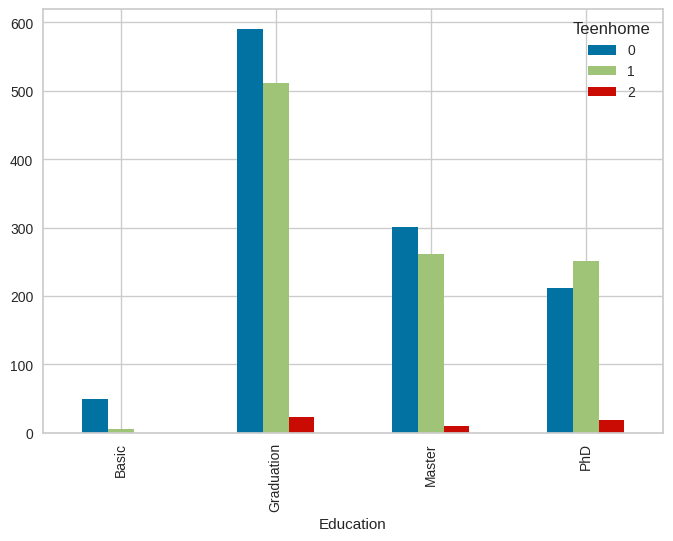

In [53]:
#plot education v teenhome
pd.crosstab(df["Education"],df["Teenhome"]).plot(kind="bar" ,stacked=False)
plt.show()

### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values

**Think About It:**

- Can we extract the age of each customer and create a new feature?
- Can we find the total kids and teens in the home?
- Can we find out how many members each family has?
- Can we find the total amount spent by the customers on various products?
- Can we find out how long the customer has been with the company?
- Can we find out how many offers the customers have accepted?
- Can we find out amount spent per purchase?



In [54]:
#subtract birth year from current year
df["age"]=2016-pd.to_datetime(df["Year_Birth"],format="%Y").apply(lambda x:x.year)

In [55]:
#look at age values
df["age"].sort_values()

1170     20
46       20
696      21
747      21
1850     21
       ... 
424      75
1950     76
192     116
339     117
239     123
Name: age, Length: 2232, dtype: int64

In [56]:
#drop outliers that seem like data error
df.drop(index=[192,339,239],inplace=True)

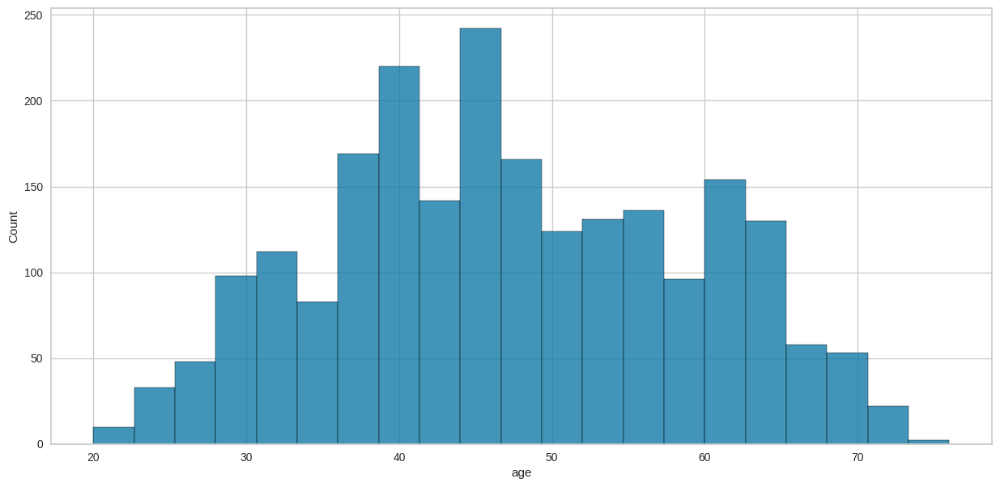

In [57]:
#histplot age
plt.figure(figsize=(15, 7))
sns.histplot(x='age', data=df)
plt.show()

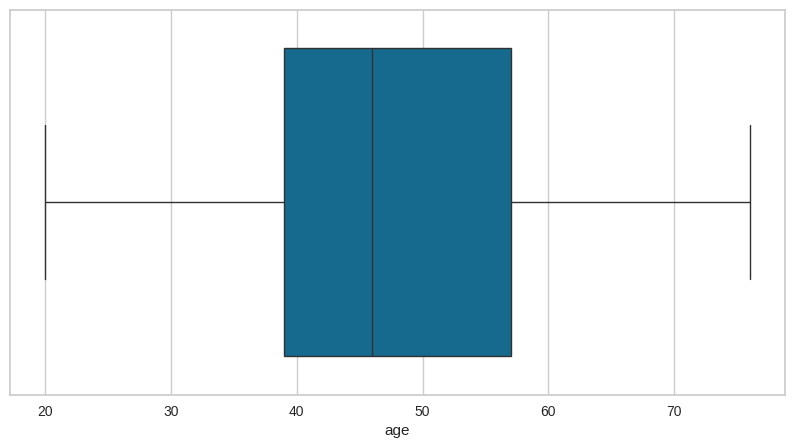

In [58]:
#boxplot age
plt.figure(figsize=(10, 5))
sns.boxplot(x='age', data=df)
plt.show()

In [59]:
#total kids column
df["kids"]=df["Kidhome"]+ df["Teenhome"]

In [60]:
#combining subcategories of marital status
df["Marital_Status"].replace("Married", "Relationship", inplace=True)
df["Marital_Status"].replace("Together", "Relationship", inplace=True)
df["Marital_Status"].replace("Divorced", "Single", inplace=True)
df["Marital_Status"].replace("Widow", "Single", inplace=True)

In [61]:
#Setting marital status to numerical
df["Marital_Status_Num"]=df["Marital_Status"].replace({"Relationship": 2, "Single":1})

In [62]:
#total fam size column
df["Fam_Size"]=df["Marital_Status_Num"]+df["kids"]

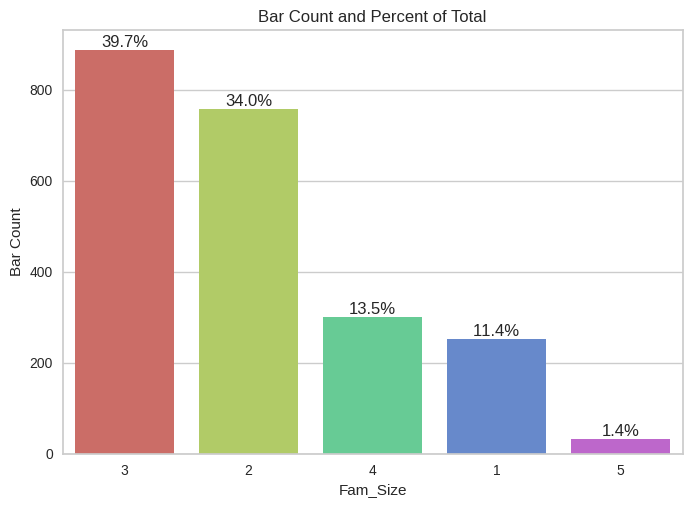

In [63]:
#countplot with percent for FamSize
ax = sns.countplot(x="Fam_Size", data=df, order = df["Fam_Size"].value_counts().index, palette="hls")
ax.set(ylabel='Bar Count', title='Bar Count and Percent of Total')

# add annotations
for c in ax.containers:

    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{h/df.Marital_Status.count()*100:0.1f}%' if (h := v.get_height()) > 0 else '' for v in c]

    ax.bar_label(c, labels=labels, label_type='edge')

plt.show()

In [64]:
#total spend column
df["Total_Spend"]=df['MntWines']+ df['MntFruits']+ df['MntMeatProducts']+ df['MntFishProducts']+ df['MntSweetProducts']+ df['MntGoldProds']

In [65]:
#total number of purchases column
df["Total_Num_Purchases"]=df['NumDealsPurchases']+ df['NumWebPurchases']+ df['NumCatalogPurchases']+ df['NumStorePurchases']

In [66]:
#converting data type to datetime
df["Dt_Customer"]=pd.to_datetime(df["Dt_Customer"])

In [67]:
#min date customer
df["Dt_Customer"].min()

Timestamp('2012-01-08 00:00:00')

In [68]:
#max date customer
df["Dt_Customer"].max()

Timestamp('2014-12-06 00:00:00')

In [69]:
#day column, convert to datetime
df["day"]="01-01-2015"
df["day"]=pd.to_datetime(df.day)

In [70]:
#days engagement column
df["days_engagement"]=(df["day"]-df["Dt_Customer"]).dt.days

In [71]:
#column for accept campaign or not
df["Total_Cmp_Accept"]=df["AcceptedCmp1"]+df["AcceptedCmp2"]+df["AcceptedCmp3"]+df["AcceptedCmp4"]+df["AcceptedCmp5"]+df["Response"]

In [72]:
#spend per purchase column
df["Spend_per_Purchase"]=df["Total_Spend"]/df["Total_Num_Purchases"]

In [73]:
#minimum spend per purchase
df["Spend_per_Purchase"].min()

0.5333333333333333

In [74]:
#maximum spend per purchase
df["Spend_per_Purchase"].max()

inf

In [75]:
#values of total number of purchases
df["Total_Num_Purchases"].sort_values()

981      0
1524     0
2214     1
774      1
2228     1
        ..
627     34
1252    34
412     35
432     39
21      43
Name: Total_Num_Purchases, Length: 2229, dtype: int64

In [76]:
#removal of entries with 0 purchases
df.drop(index=[981, 1524],inplace=True)

In [77]:
#summary stats of spend per purchase
df["Spend_per_Purchase"].describe()

count    2227.000000
mean       33.274270
std        45.040897
min         0.533333
25%         9.714286
50%        23.352941
75%        45.281773
max      1679.000000
Name: Spend_per_Purchase, dtype: float64

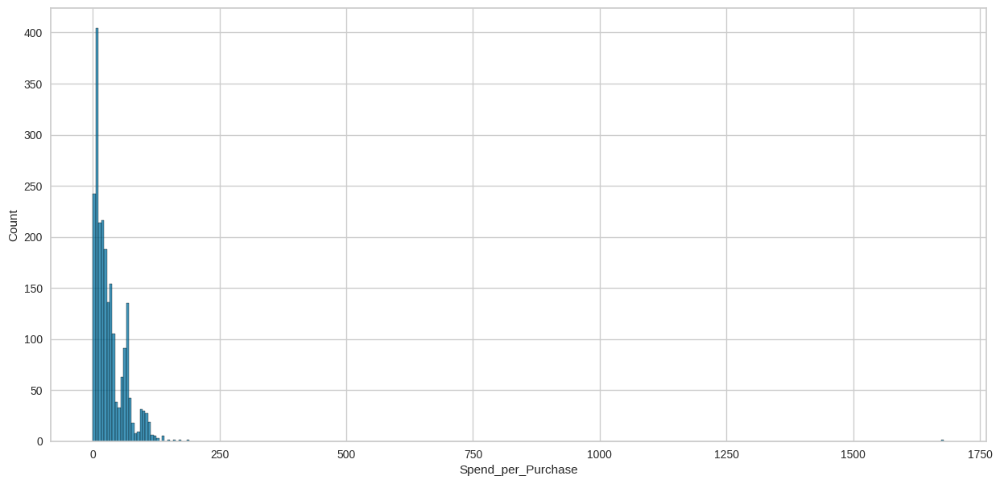

In [78]:
#histplot of spend per purchase
plt.figure(figsize=(15, 7))
sns.histplot(x='Spend_per_Purchase', data=df)
plt.show()

In [79]:
#replacing missing income data with median value
df.Income.fillna(df.Income.median(), inplace=True)

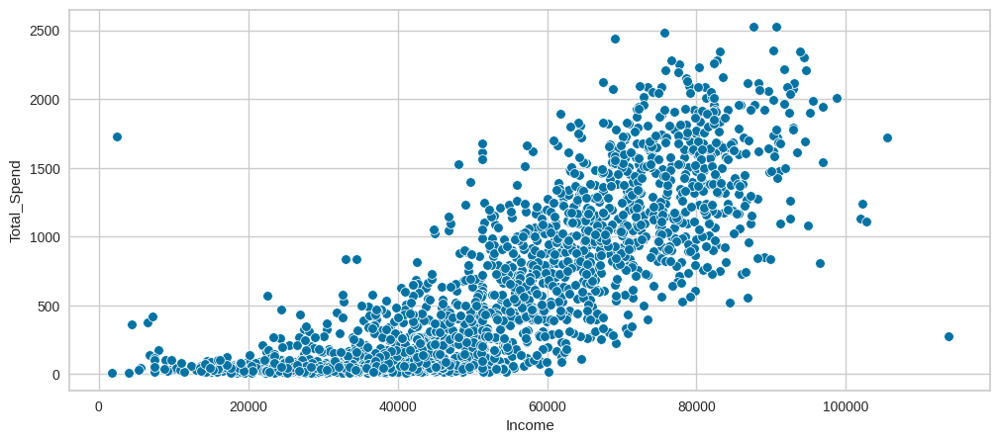

In [80]:
#Scatter plot income v total spend
plt.figure(figsize=(12,5))
sns.scatterplot(data=df, x="Income", y="Total_Spend")
plt.show()

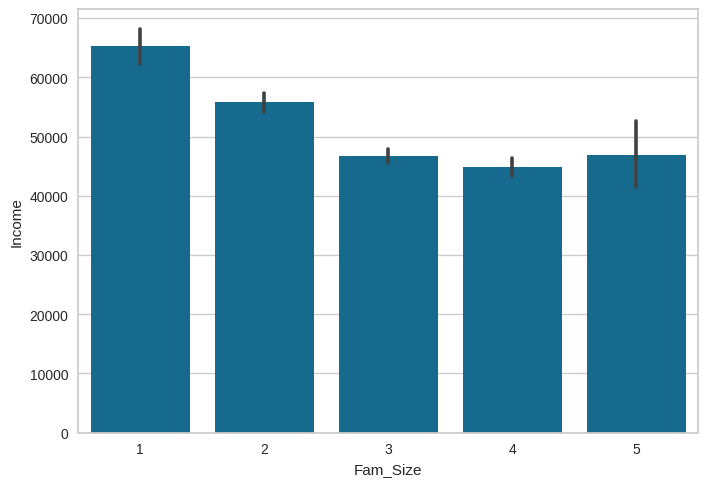

In [81]:
#plt famsize v income
sns.barplot(x="Fam_Size", y="Income", data=df)
plt.show()

## **Important Insights from EDA and Data Preprocessing**

What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?
* Income has a strong negative correlation with Number of web visits per month, and a positive correlation with Mntwines, mntfruits, mntmeatproducts, mntfishproducts, mntsweetproducts, mntgoldprods, NumWebPurchases, NumCatalogPurchases, and NumStorePurchases. This makes sense, as the more money customers make, the more they can spend.
* Mntwines, mnt fruits, mntmeatproducts, mtn fish, mnet gold are all positively correlated with each other.
* Mntwines, mnt fruits, mntmeatproducts, mtn fish, mnet gold are all negatively correlated with number of web visits per month. They are all positively correlated with NumWebPurchases, NumCatalogPurchases, and NumStorePurchases.
* Number of web visits per month is negatively correlated with all product categories, number of store purchases, and number of catelog purchases. It is positively correlated with number of deals purchases.
* Income is even across the education categories, except for “basic”, which earns roughly half that of the other categories.
* Widow has the highest income, single has the lowest income.
* 0 kids at home has the highest income, 1 or 2 kids at home make about the same.
* 2 teens at home has the highest income, 0 or 1 teens at home make about the same.
* Age is slightly right skewed, with ages from 20-76. The median age is about 47. There are no outliers.
* Most customers have a family size of 3 (39.7%), then 2 (34.0%), 4 (13.5%), 1 (11.4%), and 5 (1.4%).
* In dollars, the minimum spend per purchase is 0.53. The maximum spend per purchase is 1679.00. The median is 23.35, the average is 33.27. The spend per purchase is right-skewed, with some extreme outliers.
* Income versus total spend shows that as income increases, so does total spending, which is expected.
* The larger the family size, the lower the income, with the slight exception of a family of 5 making about the same as a family of 3.


## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

In [82]:
# Dropping irrelevant columns and storing in df_seg
df_seg = df.drop(
    columns=[
        "Year_Birth",
        "Dt_Customer",
        "day",
        "Complain",
        "Response",
        "AcceptedCmp1",
        "AcceptedCmp2",
        "AcceptedCmp3",
        "AcceptedCmp4",
        "AcceptedCmp5",
        "Marital_Status",
        "Marital_Status_Num",
        "kids",
        'Education',
        'Kidhome',
        'Teenhome'
    ],
    axis=1,
)

In [83]:
#shape of dataframe
df_seg.shape

(2227, 20)

In [84]:
df_seg.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase
0,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,59,1,1617,25,997,1,64.680000
1,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,62,3,27,6,151,0,4.500000
2,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,51,2,776,21,498,0,36.952381
3,26646.0,26,11,4,20,10,3,5,2,2,0,4,6,32,3,53,8,91,0,6.625000
4,58293.0,94,173,43,118,46,27,15,5,5,3,6,5,35,3,422,19,347,0,22.210526


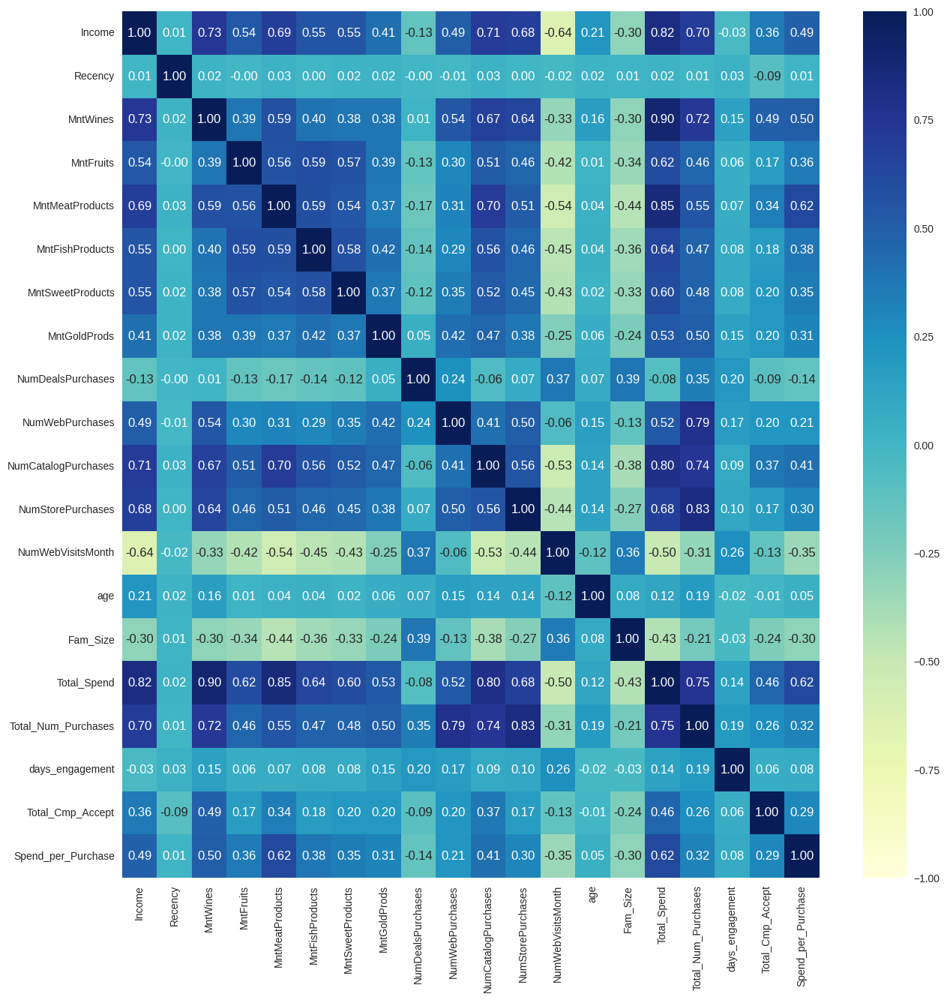

In [85]:
#heatmap
plt.figure(figsize=(15,15))
sns.heatmap(df_seg.corr(), annot=True, vmin=-1, vmax=1, fmt="0.2f", cmap="YlGnBu")
plt.show()

In [86]:
#scaling data
scaler=StandardScaler()

In [87]:
#fit and transform
df_scaled=scaler.fit_transform(df_seg)

In [88]:
#put into dataframe
df_scaled=pd.DataFrame(df_scaled, columns=df_seg.columns)

In [89]:
df_scaled.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase
0,0.315061,0.306906,0.979274,1.549793,1.735137,2.455586,1.471064,0.841828,0.357919,1.404892,2.633008,-0.561330,0.696875,1.015303,-1.761150,1.682349,1.329371,1.975678,0.619416,0.697428
1,-0.258669,-0.384035,-0.873925,-0.638021,-0.726901,-0.652191,-0.633425,-0.732464,-0.169952,-1.119121,-0.586255,-1.178960,-0.135935,1.271507,0.444125,-0.963691,-1.167064,-1.667464,-0.503906,-0.638991
2,0.970565,-0.798600,0.358572,0.569049,-0.175222,1.340442,-0.149634,-0.041311,-0.697824,1.404892,-0.228559,1.291559,-0.552339,0.332094,-0.658513,0.282777,0.803806,-0.173173,-0.503906,0.081680
3,-1.216897,-0.798600,-0.873925,-0.562579,-0.663070,-0.505942,-0.585045,-0.751662,-0.169952,-0.758548,-0.943951,-0.561330,0.280470,-1.290528,0.444125,-0.920422,-0.904281,-1.925843,-0.503906,-0.591801
4,0.322601,1.550599,-0.392806,0.418165,-0.216256,0.152175,-0.004497,-0.559676,1.413662,0.323172,0.129137,0.056299,-0.135935,-1.034324,0.444125,-0.306341,0.541023,-0.823427,-0.503906,-0.245693


## **Applying T-SNE and PCA to the data to visualize the data distributed in 2 dimensions**

### **Applying T-SNE**

In [90]:
#create tsne
tsne=TSNE(n_components=2, random_state=1, perplexity=35)

In [91]:
#fit and trasform
df_tsne=tsne.fit_transform(df_scaled)

In [92]:
#put into dataframe
df_tsne=pd.DataFrame(df_tsne, columns = [0,1])

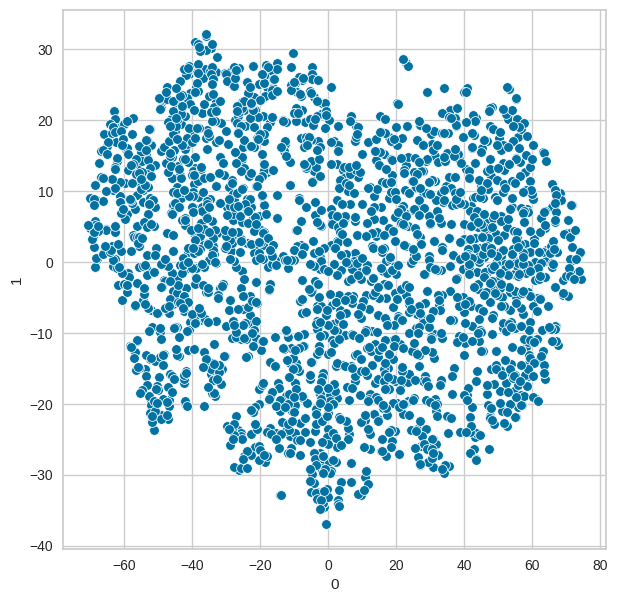

In [93]:
#scatterplot of tsne
plt.figure(figsize=(7,7))
sns.scatterplot(x=0, y=1, data=df_tsne)
plt.show()

**Observation and Insights:**
* There seems to be 2 clusters of data, but they are not very clear or defined. Another clustering method may be more appropriate.


### **Applying PCA**

**Think about it:**
- Should we apply clustering algorithms on the current data or should we apply PCA on the data before applying clustering algorithms? How would this help?

In [94]:
#define n
n=df_seg.shape[1]

In [95]:
#create pca
pca=PCA(n_components=n)

In [96]:
#put into dataframe
df_pca=pd.DataFrame(pca.fit_transform(df_scaled))

In [97]:
#explained variance
exp_var=pca.explained_variance_ratio_

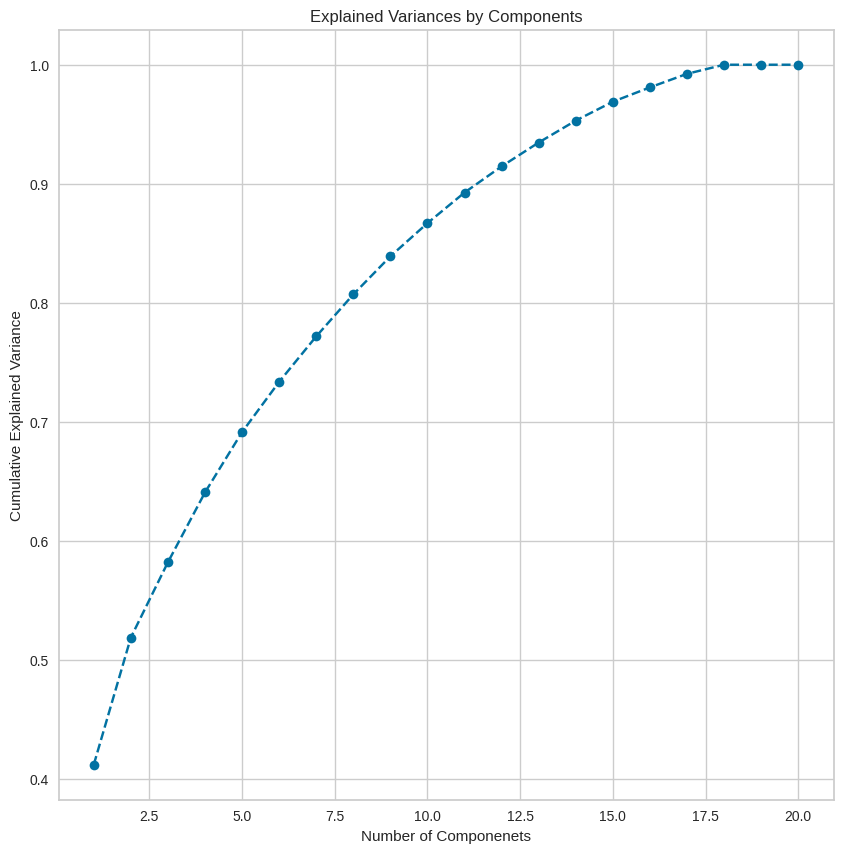

In [98]:
#plot of explained variance
plt.figure(figsize = (10,10))
plt.plot(range (1,21),exp_var.cumsum(), marker="o", linestyle="--")
plt.title("Explained Variances by Components")
plt.xlabel ("Number of Componenets")
plt.ylabel("Cumulative Explained Variance")
plt.show()

In [99]:
#finding the least number of PCs to explain 90% variance
sum=0
for ix, i in enumerate (exp_var):
  sum=sum+i
  if (sum>0.90):
    print ("Number of Principal Componenets that explain at least 90% Variance: ", ix+1)
    break


Number of Principal Componenets that explain at least 90% Variance:  12


In [100]:
#highilight variation
def color_high (val):
  if val <= -0.40:
    return "background: pink"
  elif val >= 0.40:
    return "background: skyblue"
df_pca.T.style.applymap(color_high)

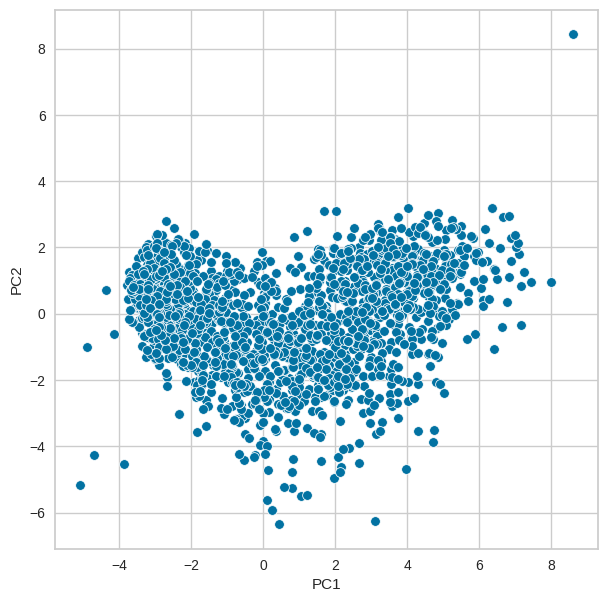

In [101]:
#scatterplot of PC1 v PC2
plt.figure (figsize=(7,7))
sns.scatterplot(x=df_pca[0], y=df_pca[1])
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

**Observation and Insights:**
* It takes 5 principal components to explain 70% of the variance, and 12 principal componenets to explain 90% of the variance.
* No obvious clusters are present. Further clustering is needed.

## **K-Means**

**Think About It:**

- How do we determine the optimal K value from the elbow curve?
- Which metric can be used to determine the final K value?

In [102]:
#define kmeans, fit to df_pca, add to list
distortions = []
K = range(2, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k,random_state=4)
    kmeanModel.fit(df_pca)
    distortions.append(kmeanModel.inertia_)

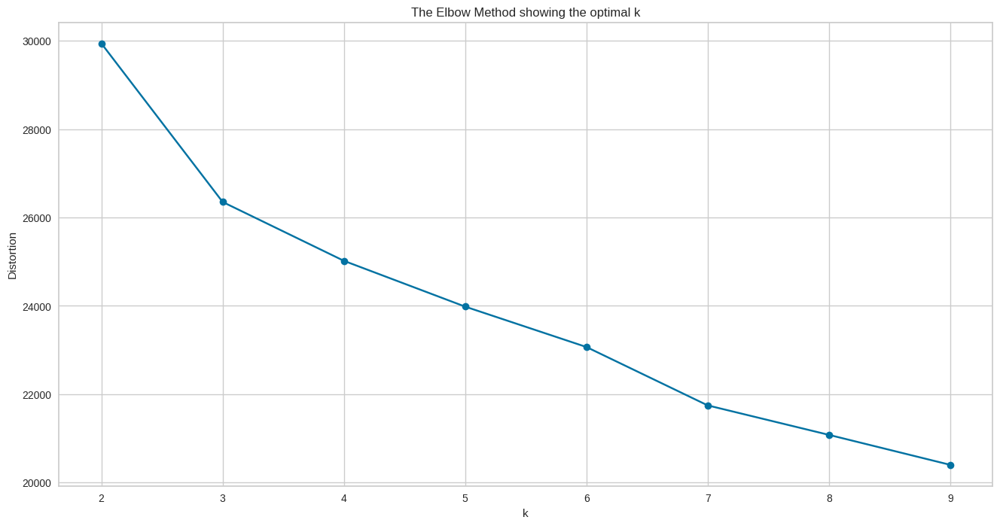

In [103]:
# Plotting the elbow plot
plt.figure(figsize=(16, 8))
plt.plot(K, distortions, marker="o")
plt.xlabel("k")
plt.ylabel("Distortion")
plt.title("The Elbow Method showing the optimal k")
plt.show()

In [104]:
#finding silhouette scores
ss={}
for k in range(3,8):
  kmeans=KMeans(n_clusters=k, random_state=1).fit(df_pca)
  labels=kmeans.predict(df_pca)
  ss[k]=(silhouette_score(df_pca, labels))
  print ("For n_clusters = {}, the silhouette score is {}".format(k, ss))

For n_clusters = 3, the silhouette score is {3: 0.23961128378882757}
For n_clusters = 4, the silhouette score is {3: 0.23961128378882757, 4: 0.22109426321660575}
For n_clusters = 5, the silhouette score is {3: 0.23961128378882757, 4: 0.22109426321660575, 5: 0.1918065463636907}
For n_clusters = 6, the silhouette score is {3: 0.23961128378882757, 4: 0.22109426321660575, 5: 0.1918065463636907, 6: 0.10481365690367243}
For n_clusters = 7, the silhouette score is {3: 0.23961128378882757, 4: 0.22109426321660575, 5: 0.1918065463636907, 6: 0.10481365690367243, 7: 0.10577701634341967}


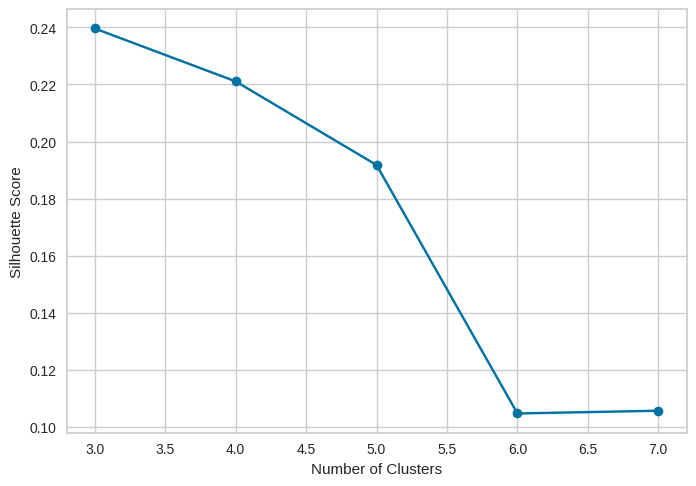

In [105]:
#plot of silhouette scores
plt.figure()
plt.plot(list(ss.keys()), list(ss.values()), marker="o")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

**Observations:**
* The silhouette score is highest when there are 3 clusters. The elbow plot also indicates 3 clusters as significant.

### **Applying KMeans on the PCA data and visualize the clusters**

In [106]:
#define kmeans with 3 clusters
kmeans1=KMeans(n_clusters=3, random_state=1)

In [107]:
#fit to df_pca
kmeans1.fit(df_pca)

KMeans(n_clusters=3, random_state=1)

In [108]:
#add labels to df
df["kmeans_3seg"]=kmeans1.labels_

In [109]:
#add labels to df_seg
df_seg["kmeans_3seg"]=kmeans1.labels_

In [110]:
#add labels to df_pca
df_pca["kmeans_3seg"]=kmeans1.labels_

In [111]:
#distribution
df_seg["kmeans_3seg"].value_counts()

1    1033
0     627
2     567
Name: kmeans_3seg, dtype: int64

In [112]:
#degine PCA plot
def PCA_PLOT(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster)

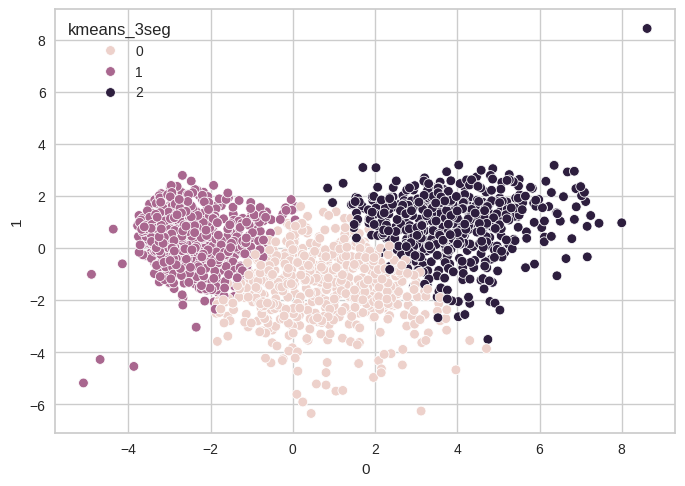

In [113]:
#plot kmeans 3 clusters
PCA_PLOT(0, 1, df_pca, "kmeans_3seg")

### **Cluster Profiling**

In [114]:
#create data frame of means and medians
mean=df_seg.groupby("kmeans_3seg").mean()
median=df_seg.groupby("kmeans_3seg").median()
df_kmeans=pd.concat([mean, median], axis=0)
df_kmeans.index=["Group0 Mean", "Group1 Mean", "Group2 Mean", "Group0 Median", "Group1 Median", "Group2 Median"]
df_kmeans

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase
Group0 Mean,57463.141946,47.432217,450.312600,23.132376,134.534290,30.472089,24.221691,61.267943,3.827751,6.454545,3.043062,7.789474,5.787879,50.829346,2.838915,723.940989,21.114833,594.529506,0.377990,33.947613
Group1 Mean,34816.450145,49.576960,41.761859,4.876089,22.495644,7.208132,5.107454,15.276864,1.987415,2.090997,0.559535,3.229429,6.404647,44.606002,2.874153,96.726041,7.867377,500.348500,0.175218,11.075644
Group2 Mean,75934.978836,50.139330,624.931217,69.114638,460.008818,101.149912,70.687831,77.830688,1.266314,5.171076,5.980600,8.352734,2.851852,47.564374,1.825397,1403.723104,20.770723,544.924162,1.024691,72.972673
Group0 Median,57954.000000,48.000000,384.000000,14.000000,115.000000,17.000000,13.000000,42.000000,3.000000,6.000000,3.000000,8.000000,6.000000,51.000000,3.000000,660.000000,21.000000,603.000000,0.000000,31.136364
Group1 Median,34704.000000,49.000000,22.000000,2.000000,15.000000,3.000000,2.000000,10.000000,2.000000,2.000000,0.000000,3.000000,7.000000,43.000000,3.000000,64.000000,7.000000,489.000000,0.000000,9.000000
Group2 Median,76467.000000,53.000000,565.000000,54.000000,424.000000,91.000000,57.000000,57.000000,1.000000,5.000000,6.000000,8.000000,2.000000,47.000000,2.000000,1376.000000,21.000000,568.000000,1.000000,67.071429


In [115]:
#highlight max avg value
df_kmeans.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase
Group0 Mean,57463.141946,47.432217,450.312600,23.132376,134.534290,30.472089,24.221691,61.267943,3.827751,6.454545,3.043062,7.789474,5.787879,50.829346,2.838915,723.940989,21.114833,594.529506,0.377990,33.947613
Group1 Mean,34816.450145,49.576960,41.761859,4.876089,22.495644,7.208132,5.107454,15.276864,1.987415,2.090997,0.559535,3.229429,6.404647,44.606002,2.874153,96.726041,7.867377,500.348500,0.175218,11.075644
Group2 Mean,75934.978836,50.139330,624.931217,69.114638,460.008818,101.149912,70.687831,77.830688,1.266314,5.171076,5.980600,8.352734,2.851852,47.564374,1.825397,1403.723104,20.770723,544.924162,1.024691,72.972673
Group0 Median,57954.000000,48.000000,384.000000,14.000000,115.000000,17.000000,13.000000,42.000000,3.000000,6.000000,3.000000,8.000000,6.000000,51.000000,3.000000,660.000000,21.000000,603.000000,0.000000,31.136364
Group1 Median,34704.000000,49.000000,22.000000,2.000000,15.000000,3.000000,2.000000,10.000000,2.000000,2.000000,0.000000,3.000000,7.000000,43.000000,3.000000,64.000000,7.000000,489.000000,0.000000,9.000000
Group2 Median,76467.000000,53.000000,565.000000,54.000000,424.000000,91.000000,57.000000,57.000000,1.000000,5.000000,6.000000,8.000000,2.000000,47.000000,2.000000,1376.000000,21.000000,568.000000,1.000000,67.071429


In [116]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

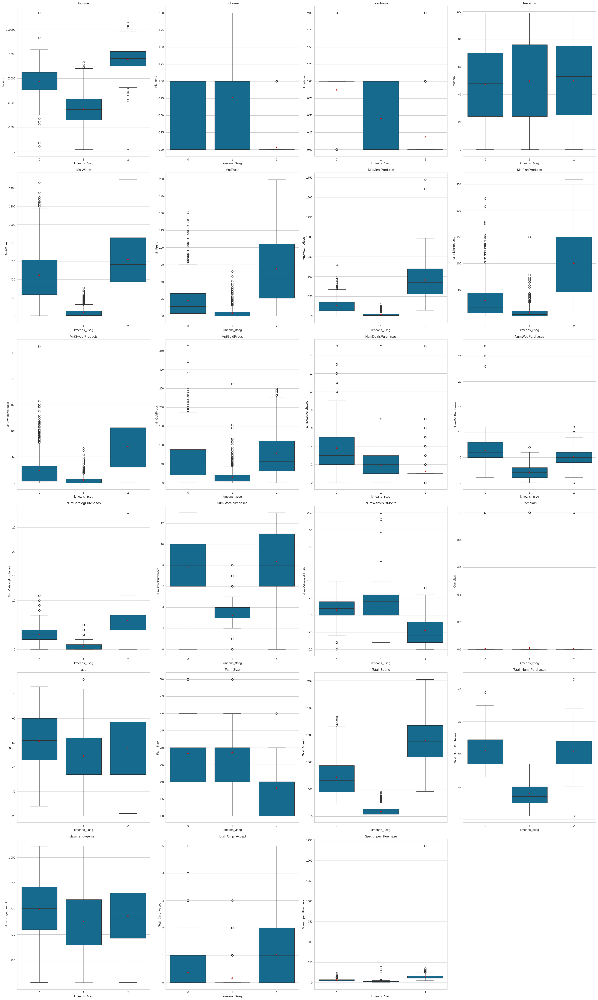

In [117]:
# Creating boxplot each variable
all_col = col_plot

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['kmeans_3seg'],showmeans=True)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [118]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances

In [119]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["kmeans_3seg"]))

817.7530402965809


**Observations and Insights:**
* The clusters are distinct and obvious, with not much overlap. The calinski harabasz score is 817.75. The silhouette score is 0.2396.

### **Describe the characteristics of each cluster**
* Cluster 0 has medium income (30,000-85,000, median of 57,954, mean of 57,463), a medium amount of kids, highest amount of teenagers, buys the medium amount of each product sold, has the highest amount of deals purchased (median of 3) and web purchases, a medium amount of catalog purchases and store purchases, and has a medium amount of web visits per month (median of 6). This group is the oldest in age (median of 51) , with a  median family size of 3, has a medium amount of total spend (mean of 723.94, median of 660), a medium amount of campaign acceptance, and a medium amount of spending per purchase(mean of 22.95, median of 31.14).
* Cluster 1 has a low income (0-70,000, median of 34704, mean of 34,816), the highest amount of kids and teens at home, the lowest amount of products bought, a medium amount of deals bought (median of 2), and the lowest amount of web purchases. This group bought the least from catalog or in store, and has the highest number of web visits per month (median of 7). This group is the youngest in age (median of 43), with a median family size of 3, has the lowest amount of total spend (mean of 96.82, median of 64), lowest amount of total purchases (median of 7), the lowest days of engagement, campaign acceptance, and spend per purchase (mean of 11.08, median of 9).
* Cluster 2 has a high income (50,000-100,000, median of 76,467, mean of 75,934), the lowest amount of kids and teens at home, the highest amount of products bought, the lowest amount of deals bought (median of 1), a medium amount of web purchases, the highest amount of catalog and store purchases, and the lowest number of web visits per month (median of 2). This group has a medium age (median of 47), which the lowest family size (median of 2), has the highest amount of total spend (mean of 1403.72, median of 1376), a high amount of total purchases, the highest campaign acceptance, and the highest spend per purchase (median of 67.07, mean of 72.97).


**Think About It:**
- Are the K-Means profiles providing any deep insights into customer purchasing behavior or which channels they are using?
- What is the next step to get more meaningful insights?

**Summary of each cluster:**

In [120]:
#drop 3 cluster label
df_pca.drop(columns= "kmeans_3seg", inplace=True)

In [121]:
#drop 3 cluster label
df.drop(columns="kmeans_3seg", inplace=True)

In [122]:
#define kmeans with 5 clusters
kmeans5=KMeans(n_clusters=5, random_state=1)

In [123]:
#fit to df_pca
kmeans5.fit(df_pca)

KMeans(n_clusters=5, random_state=1)

In [124]:
#add labels to df_pca
df_pca["kmeans_5seg"]=kmeans5.labels_

In [125]:
#add labels to df_seg
df_seg["kmeans_5seg"]=kmeans5.labels_

In [126]:
#add labels to df
df["kmeans_5seg"]=kmeans5.labels_

In [127]:
#distribution
df_seg["kmeans_5seg"].value_counts()

0    978
2    465
1    446
4    337
3      1
Name: kmeans_5seg, dtype: int64

In [128]:
#degine pca plot
def PCA_PLOT2(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster, palette="tab10")

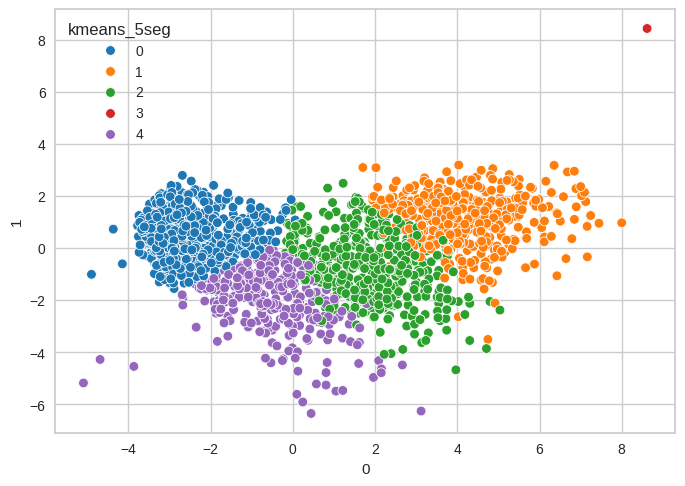

In [129]:
#scatter plot 5 clusters
PCA_PLOT2(0, 1, df_pca, "kmeans_5seg")

In [130]:
#data frame of means and medians
mean=df_seg.groupby("kmeans_5seg").mean()
median=df_seg.groupby("kmeans_5seg").median()
df_kmeans5=pd.concat([mean, median], axis=0)
df_kmeans5.index=["Group0 Mean", "Group1 Mean", "Group2 Mean", "Group3 Mean", "Group4 Mean", "Group0 Median", "Group1 Median", "Group2 Median", "Group3 Median", "Group4 Median"]
df_kmeans5

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg
Group0 Mean,34627.020450,49.171779,37.077710,4.914110,20.644172,6.769939,5.026585,14.608384,1.832311,1.976483,...,3.197342,6.306748,44.440695,2.856851,89.040900,7.521472,489.213701,0.156442,10.761945,0.994888
Group1 Mean,77854.952915,49.863229,663.695067,70.011211,506.338565,106.715247,73.784753,78.190583,1.116592,4.995516,...,8.199552,2.670404,47.069507,1.721973,1498.735426,20.605381,537.930493,1.219731,75.410431,2.000000
Group2 Mean,64318.658065,48.948387,523.993548,41.374194,196.825806,50.967742,40.204301,69.769892,2.490323,6.443011,...,8.974194,4.554839,50.501075,2.488172,923.135484,21.939785,561.541935,0.313978,42.767348,0.520430
Group3 Mean,51315.000000,53.000000,32.000000,2.000000,1607.000000,12.000000,4.000000,22.000000,0.000000,0.000000,...,1.000000,0.000000,38.000000,2.000000,1679.000000,1.000000,754.000000,1.000000,1679.000000,2.000000
Group4 Mean,48967.032641,48.186944,308.198813,10.258160,86.848665,17.732938,11.928783,49.557864,5.112760,5.881306,...,5.928783,7.077151,50.267062,3.154303,484.525223,18.973294,647.961424,0.459941,24.859786,0.172107
Group0 Median,34335.000000,49.000000,19.000000,2.000000,14.000000,3.000000,2.000000,9.000000,2.000000,2.000000,...,3.000000,7.000000,43.000000,3.000000,61.000000,7.000000,476.000000,0.000000,8.666667,1.000000
Group1 Median,78598.500000,54.000000,620.500000,56.500000,471.500000,97.000000,60.000000,56.500000,1.000000,5.000000,...,8.000000,2.000000,46.000000,2.000000,1486.500000,20.000000,542.500000,1.000000,68.716578,2.000000
Group2 Median,64795.000000,49.000000,479.000000,28.000000,172.000000,37.000000,28.000000,50.000000,2.000000,6.000000,...,9.000000,5.000000,50.000000,3.000000,908.000000,22.000000,569.000000,0.000000,37.809524,0.000000
Group3 Median,51315.000000,53.000000,32.000000,2.000000,1607.000000,12.000000,4.000000,22.000000,0.000000,0.000000,...,1.000000,0.000000,38.000000,2.000000,1679.000000,1.000000,754.000000,1.000000,1679.000000,2.000000
Group4 Median,49681.000000,50.000000,261.000000,6.000000,74.000000,10.000000,6.000000,34.000000,5.000000,6.000000,...,6.000000,7.000000,50.000000,3.000000,434.000000,18.000000,669.000000,0.000000,23.375000,0.000000


In [131]:
#max average values
df_kmeans5.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg
Group0 Mean,34627.020450,49.171779,37.077710,4.914110,20.644172,6.769939,5.026585,14.608384,1.832311,1.976483,0.515337,3.197342,6.306748,44.440695,2.856851,89.040900,7.521472,489.213701,0.156442,10.761945,0.994888
Group1 Mean,77854.952915,49.863229,663.695067,70.011211,506.338565,106.715247,73.784753,78.190583,1.116592,4.995516,6.293722,8.199552,2.670404,47.069507,1.721973,1498.735426,20.605381,537.930493,1.219731,75.410431,2.000000
Group2 Mean,64318.658065,48.948387,523.993548,41.374194,196.825806,50.967742,40.204301,69.769892,2.490323,6.443011,4.032258,8.974194,4.554839,50.501075,2.488172,923.135484,21.939785,561.541935,0.313978,42.767348,0.520430
Group3 Mean,51315.000000,53.000000,32.000000,2.000000,1607.000000,12.000000,4.000000,22.000000,0.000000,0.000000,0.000000,1.000000,0.000000,38.000000,2.000000,1679.000000,1.000000,754.000000,1.000000,1679.000000,2.000000
Group4 Mean,48967.032641,48.186944,308.198813,10.258160,86.848665,17.732938,11.928783,49.557864,5.112760,5.881306,2.050445,5.928783,7.077151,50.267062,3.154303,484.525223,18.973294,647.961424,0.459941,24.859786,0.172107
Group0 Median,34335.000000,49.000000,19.000000,2.000000,14.000000,3.000000,2.000000,9.000000,2.000000,2.000000,0.000000,3.000000,7.000000,43.000000,3.000000,61.000000,7.000000,476.000000,0.000000,8.666667,1.000000
Group1 Median,78598.500000,54.000000,620.500000,56.500000,471.500000,97.000000,60.000000,56.500000,1.000000,5.000000,6.000000,8.000000,2.000000,46.000000,2.000000,1486.500000,20.000000,542.500000,1.000000,68.716578,2.000000
Group2 Median,64795.000000,49.000000,479.000000,28.000000,172.000000,37.000000,28.000000,50.000000,2.000000,6.000000,4.000000,9.000000,5.000000,50.000000,3.000000,908.000000,22.000000,569.000000,0.000000,37.809524,0.000000
Group3 Median,51315.000000,53.000000,32.000000,2.000000,1607.000000,12.000000,4.000000,22.000000,0.000000,0.000000,0.000000,1.000000,0.000000,38.000000,2.000000,1679.000000,1.000000,754.000000,1.000000,1679.000000,2.000000
Group4 Median,49681.000000,50.000000,261.000000,6.000000,74.000000,10.000000,6.000000,34.000000,5.000000,6.000000,2.000000,6.000000,7.000000,50.000000,3.000000,434.000000,18.000000,669.000000,0.000000,23.375000,0.000000


In [132]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

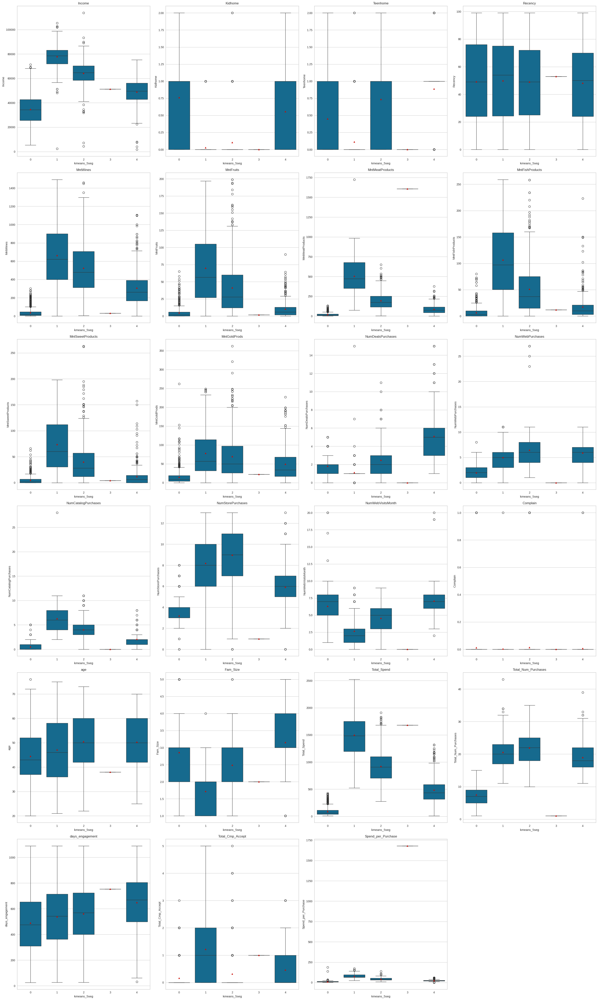

In [133]:
# Creating boxplot for each variable
all_col = col_plot

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['kmeans_5seg'],showmeans=True)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [134]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["kmeans_5seg"]))

586.3407913451668


In [135]:
#remove labels
df_pca.drop(columns="kmeans_5seg", inplace=True)

In [136]:
#remove labels
df.drop(columns="kmeans_5seg", inplace=True)

**Observations and Cluster Profiles:**
* Clustering was less clear than with 3 clusters, one group has only one data point. Not a preferred clustering method. The silhouette score is 0.1918, the calinski harabasz score is 586.34.
* Cluster 0 has the lowest income (5,000-70,000, median of 34,335, mean of 34,627), the highest amount of kids, 2nd highest amount of teenagers, buys the lowest amount of each product sold, has a medium amount of deals purchases, 2nd lowest amount of web purchases, catalog purchases and store purchases, and has the 2nd highest amount of web visits per month. This group is the 2nd youngest in age (median of 45), with a  median family size of 3, has a lowest amount of total spend, the 2nd lowest amount of total purchases, the lowest campaign acceptance, and the lowest amount of spending per purchase.
* Cluster 1 has the highest income (58,000-100,000, median of 78,598, mean of 77,854), the lowest amount of kids and teens at home, the highest amount of products bought, the 2nd lowest amount of deals bought, and the medium amount of web purchases. This group bought the most from catalog and 2nd most in store, and has the 2nd lowest number of web visits per month. This group is medium (median of 47) in age, with a median family size of 2, has the highest amount of total spend, 2nd highest amount of total purchases, the highest campaign acceptance, and highest spend per purchase.
* Cluster 2 has the 2nd highest income (40,000-90,000, median of 64,795, mean of 64,318), the lowest amount of kids at home, 2nd highest amount of teens at home, a medium amount of products bought, a medium amount of deals bought, the highest amount of web purchases, a medium amount of catalog purchases, the highest amount of store purchases, and a medium number of web visits per month. This group has the highest age (median of 50), with a medium family size (median of 2.5), has a medium amount of total spend, a high amount of total purchases, the lowest campaign acceptance, and the 2nd highest spend per purchase.
* Cluster 3 has 1 data point. This group has a medium income of 51,315, 0 kids or teens (lowest), spent little on wines, fruits, fish, sweets, and gold, and a lot on meat. They didn’t buy deals or web purchases, only has 1 store visit, does not visit the web, is late 30s with a family size of 2, has the highest total spend, lowest number of purchases, 1 campaign acceptance, and the highest spend per purchase.
* Cluster 4 has the 2nd lowest income (25,000-75,000, median of 49,681, mean of 48,967), 2nd highest amount of kids at home, highest amount of teens at home, has a medium amount of products bought (2nd lowest), the highest amount of deals bought, 2nd highest web purchases, medium amount of catalog and store purchases, highest amount of web visits per month, 2nd highest age (median of 50), with the highest family size (median of 3). The total spend is 2nd lowest, the total number of purchases is medium, with a medium campaign acceptance, and the 2nd lowest spend per purchase.


## **K-Medoids**

In [137]:
#define kmedoids with 5 clusters
kmedo=KMedoids(n_clusters=5, random_state=1)

In [138]:
#fit to df_pca
kmedo.fit(df_pca)

KMedoids(n_clusters=5, random_state=1)

In [139]:
#define labels
labels=kmedo.predict(df_pca)

In [140]:
#silhouette score
kmedo_sil_score=silhouette_score(df_pca, labels)
print(kmedo_sil_score)

0.07735845659624692


In [141]:
#add labels to df_pca
df_pca["kmedo"]=kmedo.labels_

In [142]:
#add labels to df
df["kmedo"]=kmedo.labels_

In [143]:
#add labels to df_seg
df_seg["kmedo"]=kmedo.labels_

In [144]:
#distribution
df_seg["kmedo"].value_counts()

4    534
2    442
3    427
0    424
1    400
Name: kmedo, dtype: int64

In [145]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["kmedo"]))

528.2626447621852


### **Visualize the clusters using PCA**

In [146]:
#define pca plot
def PCA_PLOT3(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster, palette="tab10")

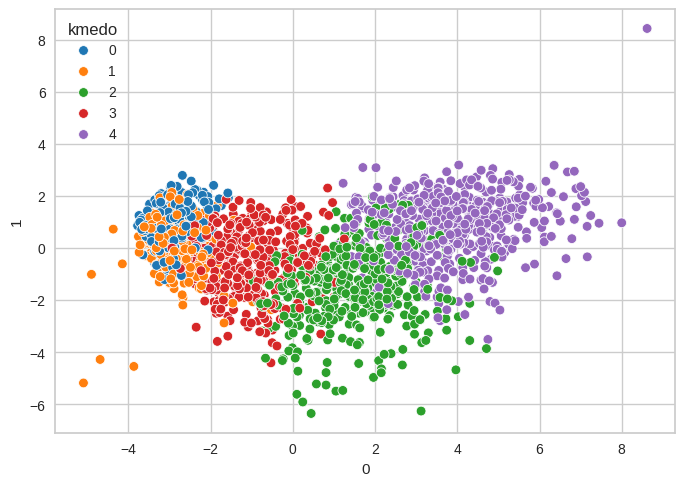

In [147]:
#plot kmedoids clusters
PCA_PLOT3(0, 1, df_pca, "kmedo")

### **Cluster Profiling**

In [148]:
#dataframe of means and medians
mean=df_seg.groupby("kmedo").mean()
median=df_seg.groupby("kmedo").median()
df_kmedo=pd.concat([mean, median], axis=0)
df_kmedo.index=["Group0 Mean", "Group1 Mean", "Group2 Mean", "Group3 Mean", "Group4 Mean", "Group0 Median", "Group1 Median", "Group2 Median", "Group3 Median", "Group4 Median"]
df_kmedo

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg
Group0 Mean,34447.464623,62.226415,21.750000,2.858491,13.483491,4.087264,3.165094,9.334906,1.643868,1.625000,...,6.021226,45.139151,2.969340,54.679245,6.497642,368.056604,0.115566,8.064032,1.000000,0.000000
Group1 Mean,28809.450000,33.547500,28.035000,5.627500,20.070000,8.615000,5.242500,16.445000,2.070000,2.020000,...,7.462500,40.845000,2.765000,84.035000,7.430000,668.545000,0.247500,10.827540,0.982500,0.250000
Group2 Mean,61250.441176,49.522624,565.020362,25.038462,189.993213,34.733032,24.450226,71.703620,3.436652,6.570136,...,5.441176,53.898190,2.527149,910.938914,22.595023,643.794118,0.567873,41.294103,0.316742,2.484163
Group3 Mean,49933.754098,50.580796,184.538642,12.105386,68.000000,17.377049,12.278689,32.566745,3.288056,4.269321,...,5.498829,49.517564,3.007026,326.866511,14.622951,484.864169,0.224824,21.609287,0.515222,2.042155
Group4 Mean,75891.391386,48.861423,619.567416,73.089888,452.543071,104.780899,76.880150,79.009363,1.353933,5.458801,...,2.941948,45.829588,1.906367,1405.870787,20.945693,530.962547,0.943820,72.794896,1.853933,1.230337
Group0 Median,34582.500000,66.000000,16.000000,2.000000,11.000000,2.000000,1.000000,6.000000,1.000000,1.000000,...,6.000000,44.000000,3.000000,47.000000,6.000000,343.500000,0.000000,7.500000,1.000000,0.000000
Group1 Median,29211.500000,29.500000,13.000000,3.000000,13.000000,4.000000,3.000000,11.000000,2.000000,2.000000,...,7.000000,40.000000,3.000000,62.000000,7.000000,680.500000,0.000000,8.633333,1.000000,0.000000
Group2 Median,62173.000000,51.000000,516.500000,16.000000,152.500000,20.000000,15.000000,48.000000,3.000000,7.000000,...,6.000000,55.000000,3.000000,870.000000,22.000000,668.000000,0.000000,36.642754,0.000000,2.000000
Group3 Median,50150.000000,52.000000,161.000000,7.000000,59.000000,10.000000,7.000000,23.000000,3.000000,4.000000,...,6.000000,49.000000,3.000000,309.000000,15.000000,466.000000,0.000000,20.807692,1.000000,2.000000
Group4 Median,76366.000000,49.500000,565.000000,61.000000,417.000000,94.000000,65.500000,58.000000,1.000000,5.000000,...,2.000000,45.000000,2.000000,1382.500000,21.000000,522.000000,0.000000,67.215909,2.000000,1.000000


In [149]:
#max avg values
df_kmedo.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg
Group0 Mean,34447.464623,62.226415,21.750000,2.858491,13.483491,4.087264,3.165094,9.334906,1.643868,1.625000,0.308962,2.919811,6.021226,45.139151,2.969340,54.679245,6.497642,368.056604,0.115566,8.064032,1.000000,0.000000
Group1 Mean,28809.450000,33.547500,28.035000,5.627500,20.070000,8.615000,5.242500,16.445000,2.070000,2.020000,0.430000,2.910000,7.462500,40.845000,2.765000,84.035000,7.430000,668.545000,0.247500,10.827540,0.982500,0.250000
Group2 Mean,61250.441176,49.522624,565.020362,25.038462,189.993213,34.733032,24.450226,71.703620,3.436652,6.570136,4.090498,8.497738,5.441176,53.898190,2.527149,910.938914,22.595023,643.794118,0.567873,41.294103,0.316742,2.484163
Group3 Mean,49933.754098,50.580796,184.538642,12.105386,68.000000,17.377049,12.278689,32.566745,3.288056,4.269321,1.599532,5.466042,5.498829,49.517564,3.007026,326.866511,14.622951,484.864169,0.224824,21.609287,0.515222,2.042155
Group4 Mean,75891.391386,48.861423,619.567416,73.089888,452.543071,104.780899,76.880150,79.009363,1.353933,5.458801,5.773408,8.359551,2.941948,45.829588,1.906367,1405.870787,20.945693,530.962547,0.943820,72.794896,1.853933,1.230337
Group0 Median,34582.500000,66.000000,16.000000,2.000000,11.000000,2.000000,1.000000,6.000000,1.000000,1.000000,0.000000,3.000000,6.000000,44.000000,3.000000,47.000000,6.000000,343.500000,0.000000,7.500000,1.000000,0.000000
Group1 Median,29211.500000,29.500000,13.000000,3.000000,13.000000,4.000000,3.000000,11.000000,2.000000,2.000000,0.000000,3.000000,7.000000,40.000000,3.000000,62.000000,7.000000,680.500000,0.000000,8.633333,1.000000,0.000000
Group2 Median,62173.000000,51.000000,516.500000,16.000000,152.500000,20.000000,15.000000,48.000000,3.000000,7.000000,4.000000,9.000000,6.000000,55.000000,3.000000,870.000000,22.000000,668.000000,0.000000,36.642754,0.000000,2.000000
Group3 Median,50150.000000,52.000000,161.000000,7.000000,59.000000,10.000000,7.000000,23.000000,3.000000,4.000000,1.000000,5.000000,6.000000,49.000000,3.000000,309.000000,15.000000,466.000000,0.000000,20.807692,1.000000,2.000000
Group4 Median,76366.000000,49.500000,565.000000,61.000000,417.000000,94.000000,65.500000,58.000000,1.000000,5.000000,6.000000,8.000000,2.000000,45.000000,2.000000,1382.500000,21.000000,522.000000,0.000000,67.215909,2.000000,1.000000


In [150]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

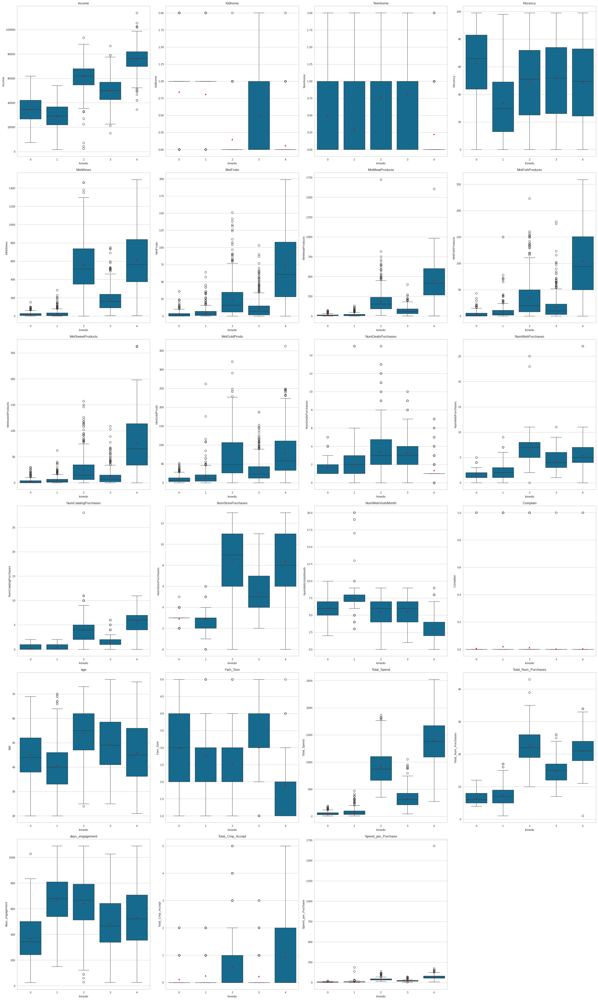

In [151]:
# Creating boxplot for each variable
all_col = col_plot

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['kmedo'],showmeans=True)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [152]:
#remove labels
df_pca.drop(columns="kmedo", inplace=True)

In [153]:
#remove labels
df.drop(columns="kmedo", inplace=True)

**Observations and Insights:**
* K-medoid clusters are fairly differentiated, however group 0 and group 1 have significant overlap.The silhouette score is 0.0773. The calinski harabasz score is 528.26.

### **Characteristics of each cluster**



**Summary for each cluster:**
* Cluster 0 has the 2nd lowest income (10,000-60,000, median of 34,582, mean of 34,447), the highest amount of kids, a medium amount of teenagers, has the longest amount since last purchase (recency), buys the lowest amount of each product sold, has the 2nd lowest amount of deals purchases and lowest amount of web purchases and catalog purchases,  the 2nd lowest amount of store purchases, and has the 2nd higest amount of web visits per month. This group is the 2nd youngest in age, with a  median family size of 3, has the lowest amount of total spend and total purchases, the lowest days of engagement, the lowest amount of campaign acceptance, and the lowest amount of spending per purchase.
* Cluster 1 has the lowest income (0-55,000, median of 29,211, mean of 28,809), the 2nd highest amount of kids and 2nd lowest amount of teens at home, the lowest recency, the 2nd lowest amount of products bought, a medium amount of deals bought, and the 2nd lowest amount of web purchases. This group bought the 2nd least from catalog or in store, and has the highest number of web visits per month. This group is the youngest in age, with a median family size of 3, has the 2nd lowest amount of total spend, 2nd lowest amount of total purchases, the highest days of engagement, 2nd highest campaign acceptance, and 2nd lowest spend per purchase.
* Cluster 2 has the 2nd highest income (35,000-90,000, median of 62,173, mean of 61,250), a medium amount of kids and teens at home, the 2nd highest amount of products bought, the highest amount of deals bought, the highest amount of web purchases, the 2nd highest amount of catalog purchases and highest amount of store purchases, and a medium amount of number of web visits per month. This group has the highest age, with a medium family size (median of 2.5), has the 2nd highest amount of total spend, a the highest amount of total purchases, the 2nd highest campaign acceptance, and the 2nd highest spend per purchase.
* Cluster 3 has a medium income (25,000-75,000, median of 50,150, mean of 49,933), a medium amount of kids and the highest amount of teens, and spent a medium amount on products . This group has the 2nd highest spend on deals, buys a medium amount of web purchases, visits the store and website a medium amount, and is the 2nd oldest group with a family size of 3. This group has a medium total spend and number of purchases, a low campaign acceptance, and a medium spend per purchase.
* Cluster 4 has the highest income (50,000-100,000, median of 76,366, mean of 75,891), the lowest amount of kids and teens at home, has the highest amount of products bought, the lowest amount of deals bought, 2nd highest web purchases, highest amount of catalog and 2nd highest store purchases, lowest amount of web visits per month, has a medium age, with the lowest family size (median of 2). The total spend is highest, the total number of purchases is 2nd highest, with the highest campaign acceptance, and the highest spend per purchase.


## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages
- Explore different linkages with each distance metric

In [154]:
# list of distance metrics
dist_mets = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]
# list of linkage methods
link_methods = ["single", "complete", "average"]
high_cophenet_corr = 0                                                 # Creating variable by assigning 0
high_dm_lm = [0, 0]                                                    # Creating list by assigning 0's
for dm in dist_mets:
    for lm in link_methods:
        Z = linkage(df_pca, metric=dm, method=lm)                    # Applying different linkages with different distance to data_pca
        c, coph_dists = cophenet(Z, pdist(df_pca))                   # Calculating cophenetic correlation
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:                                     # Checking if cophenetic correlation is higher than previous score
            high_cophenet_corr = c                                     # Appending to high_cophenet_corr list if it is higher
            high_dm_lm[0] = dm                                         # Appending its corresponding distance
            high_dm_lm[1] = lm                                         # Appending its corresponding method or linkage

Cophenetic correlation for Euclidean distance and single linkage is 0.7859037734314827.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7667326689515436.
Cophenetic correlation for Euclidean distance and average linkage is 0.8411107173407508.
Cophenetic correlation for Chebyshev distance and single linkage is 0.7653150546279008.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.672585701521267.
Cophenetic correlation for Chebyshev distance and average linkage is 0.7925367728632269.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.6544069734550587.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.5055986545741681.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.6455798481487715.
Cophenetic correlation for Cityblock distance and single linkage is 0.7858031115317373.
Cophenetic correlation for Cityblock distance and complete linkage is 0.7822212339246745.
Cophenetic corre

In [155]:
# Printing combination of distance metric and linkage method with highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.8411107173407508, which is obtained with Euclidean distance and average linkage.


In [156]:
#setting recursion limit
sys.setrecursionlimit(10000)

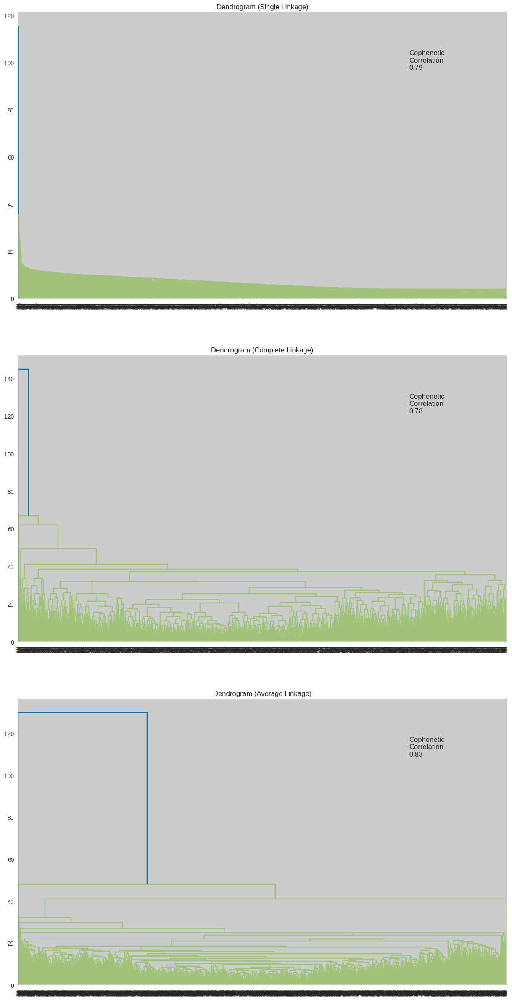

In [157]:
# List of linkage methods
link_methods = ["single", "complete", "average"]
# Lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
#create subplot image
fig, axs = plt.subplots(len(link_methods), 1, figsize=(15, 30))            # Setting plot size
# enumerate through the list of linkage methods
# Fplot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(link_methods):
    Z = linkage(df_pca, metric="Cityblock", method=method)                  # Measures the distances between two clusters
    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")           # Title of dendrogram
    coph_corr, coph_dist = cophenet(Z, pdist(df_pca))                       # Finding cophenetic correlation for different linkages with city block distance
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

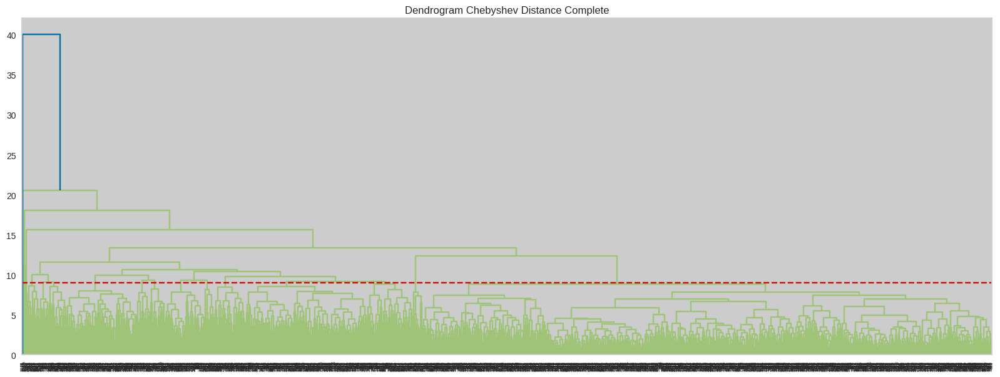

In [158]:
#plot dendrogram for Chebyshev distance with complete linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Chebyshev Distance Complete")
dend = dendrogram(linkage(df_pca, method = 'complete'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

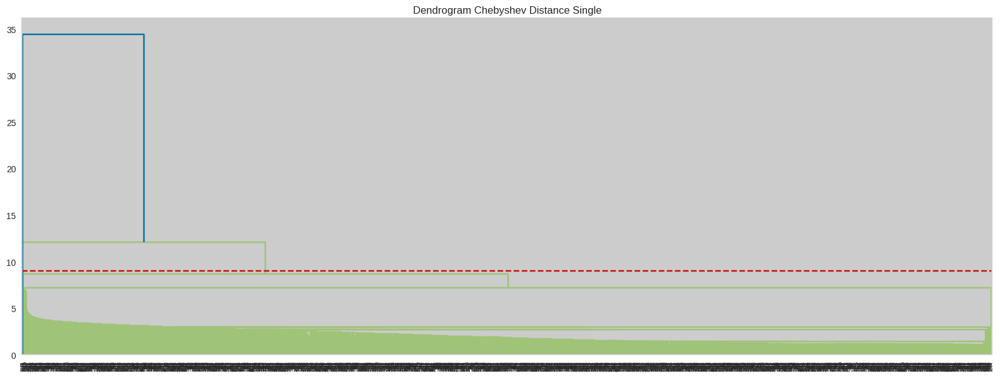

In [159]:
#plot dendrogram for Chebyshev distance with single linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Chebyshev Distance Single")
dend = dendrogram(linkage(df_pca, method = 'single'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

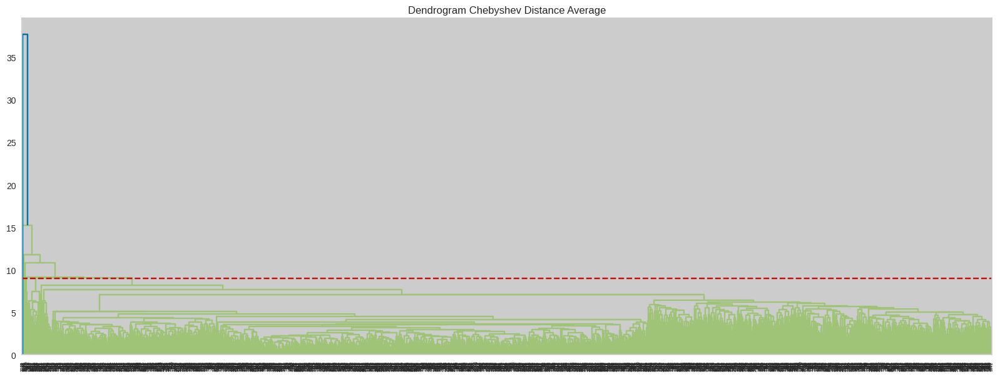

In [160]:
#plot dendrogram for Chebyshev distance with average linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Chebyshev Distance Average")
dend = dendrogram(linkage(df_pca, method = 'average'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

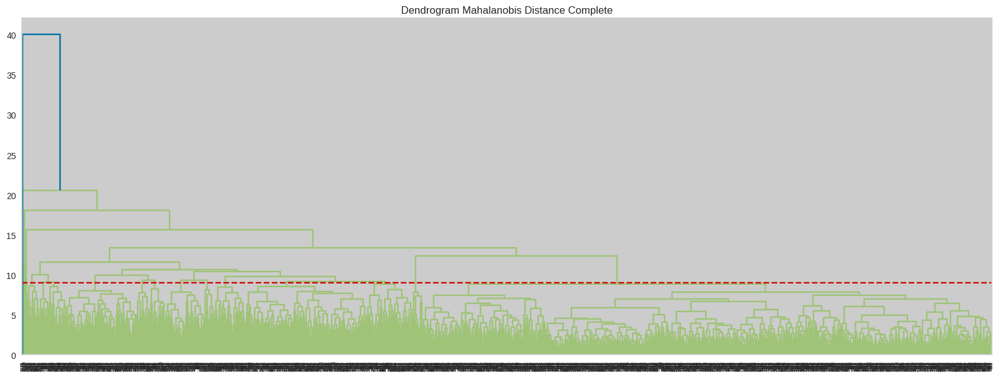

In [161]:
#plot dendrogram for Mahalanobis distance with complete linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Mahalanobis Distance Complete")
dend = dendrogram(linkage(df_pca, method = 'complete'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

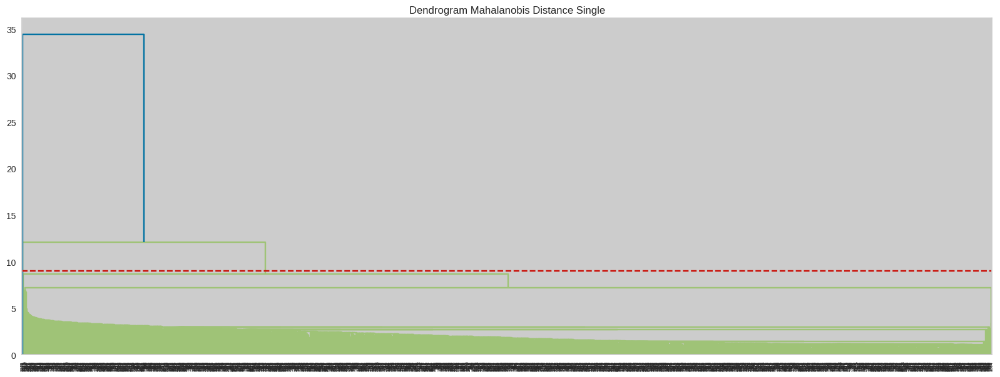

In [162]:
#plot dendrogram for Mahalanobis distance with single linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Mahalanobis Distance Single")
dend = dendrogram(linkage(df_pca, method = 'single'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

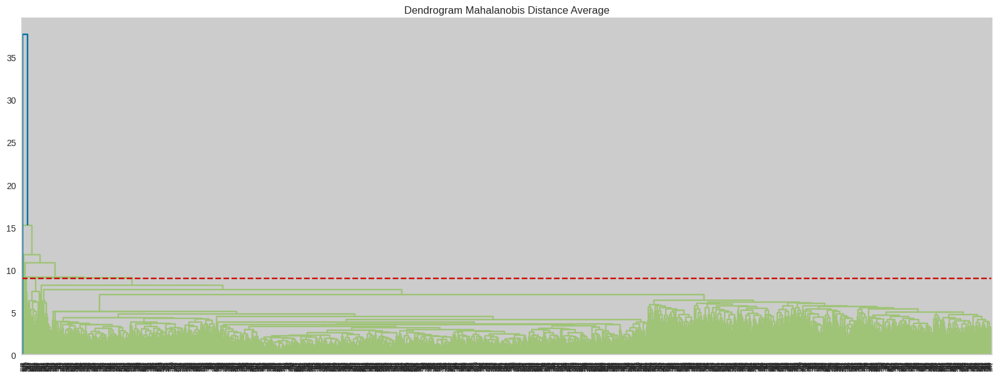

In [163]:
#plot dendrogram for Mahalanobis distance with average linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Mahalanobis Distance Average")
dend = dendrogram(linkage(df_pca, method = 'average'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

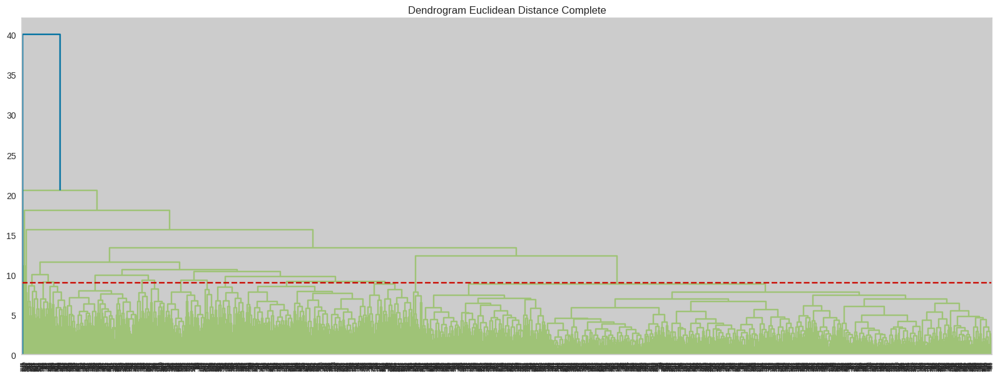

In [164]:
#plot dendrogram for Euclidean distance with complete linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Euclidean Distance Complete")
dend = dendrogram(linkage(df_pca, method = 'complete'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

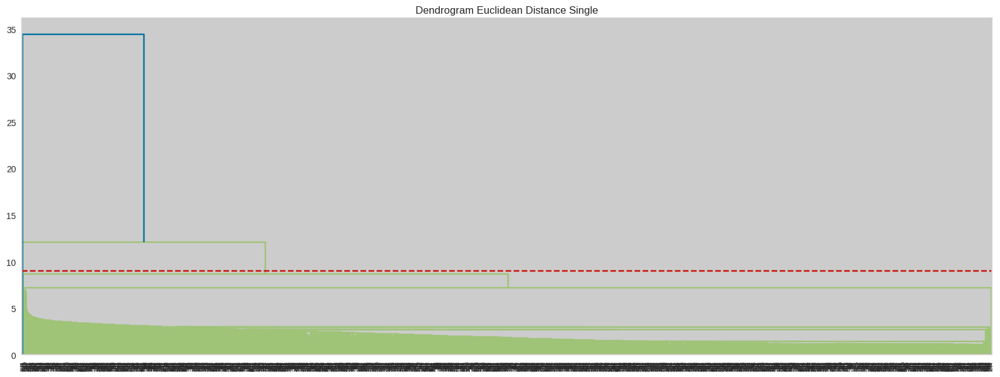

In [165]:
#plot dendrogram for Euclidean distance with single linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Euclidean Distance Single")
dend = dendrogram(linkage(df_pca, method = 'single'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

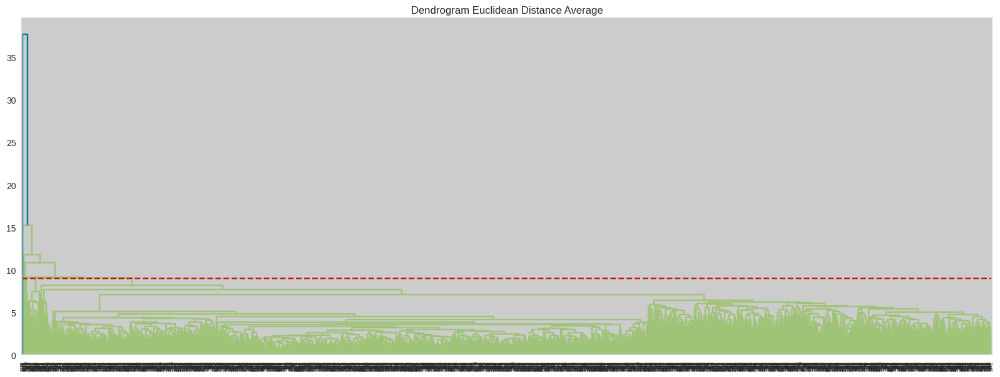

In [166]:
#plot dendrogram for Euclidean distance with average linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Euclidean Distance Average")
dend = dendrogram(linkage(df_pca, method = 'average'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

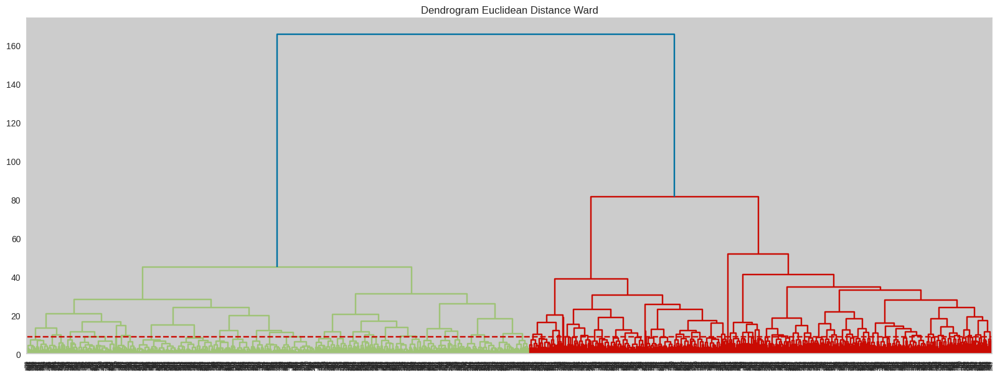

In [167]:
#plot dendrogram for Euclidean distance with ward linkage
plt.figure(figsize = (20, 7))
plt.title("Dendrogram Euclidean Distance Ward")
dend = dendrogram(linkage(df_pca, method = 'ward'))
plt.axhline(y = 9, color = 'r', linestyle = '--')
plt.show()

In [168]:
# Initialize Agglomerative Clustering
HierClus = AgglomerativeClustering(n_clusters=3, affinity= "euclidean", linkage="ward")

In [169]:
# Fit on df_pca
HierClus.fit(df_pca)

AgglomerativeClustering(affinity='euclidean', n_clusters=3)

In [170]:
# Add Agglomerative Clustering cluster labels
df_pca['HCLabels'] = HierClus.labels_

In [171]:
# Add Agglomerative Clustering cluster labels
df['HCLabels'] = HierClus.labels_

In [172]:
# Add Agglomerative Clustering cluster labels
df_seg['HCLabels'] = HierClus.labels_

In [173]:
#distribution
df_seg["HCLabels"].value_counts()

1    1160
0     609
2     458
Name: HCLabels, dtype: int64

In [174]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["HCLabels"]))

733.0099828404985


In [175]:
#silhouette score
HC_sil_score=silhouette_score(df_pca, df_pca['HCLabels'])
print(HC_sil_score)

0.2561670284448204


**Think about it:**

- Can we clearly decide the number of clusters based on where to cut the dendrogram horizontally?
- What is the next step in obtaining number of clusters based on the dendrogram?
- Are there any distinct clusters in any of the dendrograms?

### **Visualize the clusters using PCA**

In [176]:
#define PCA plot
def PCA_PLOT4(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster, palette="tab10")

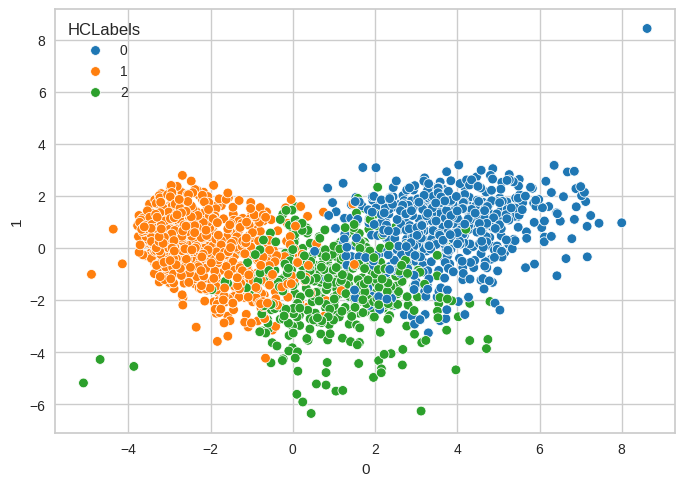

In [177]:
#plot hierachal cluster labels
PCA_PLOT4(0, 1, df_pca, "HCLabels")

### **Cluster Profiling**

In [178]:
#dataframe with medians and means
mean=df_seg.groupby("HCLabels").mean()
median=df_seg.groupby("HCLabels").median()
df_HierClus=pd.concat([mean, median], axis=0)
df_HierClus.index=["Group0 Mean", "Group1 Mean", "Group2 Mean", "Group0 Median", "Group1 Median", "Group2 Median"]
df_HierClus

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo
Group0 Mean,74911.761905,50.775041,624.134647,68.921182,438.438424,95.906404,68.279146,77.435140,1.441708,5.338259,...,47.977011,1.906404,1373.114943,20.973727,553.315271,0.980296,70.859434,1.753695,1.285714,3.620690
Group1 Mean,36601.088793,49.054310,65.953448,5.743103,30.130172,7.790517,5.598276,17.838793,2.220690,2.482759,...,45.606897,2.904310,133.054310,8.979310,517.795690,0.177586,12.460004,0.873276,0.637931,1.198276
Group2 Mean,58889.497817,47.067686,487.375546,22.039301,145.100437,35.938865,27.220524,66.539301,3.748908,6.567686,...,49.770742,2.737991,784.213974,21.733624,569.847162,0.427948,36.014845,0.187773,2.628821,2.414847
Group0 Median,75437.000000,54.000000,563.000000,57.000000,409.000000,84.000000,54.000000,57.000000,1.000000,5.000000,...,47.000000,2.000000,1338.000000,21.000000,570.000000,0.000000,66.428571,2.000000,1.000000,4.000000
Group1 Median,36648.500000,49.000000,26.500000,3.000000,17.000000,4.000000,3.000000,11.000000,2.000000,2.000000,...,44.000000,3.000000,72.000000,8.000000,513.500000,0.000000,10.200000,1.000000,0.000000,1.000000
Group2 Median,59896.500000,47.500000,455.000000,14.000000,124.000000,20.000000,15.000000,45.000000,3.000000,6.000000,...,50.000000,3.000000,732.000000,21.000000,570.500000,0.000000,33.150000,0.000000,2.000000,2.000000


In [179]:
#max avg value
df_HierClus.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo
Group0 Mean,74911.761905,50.775041,624.134647,68.921182,438.438424,95.906404,68.279146,77.435140,1.441708,5.338259,5.794745,8.399015,3.067323,47.977011,1.906404,1373.114943,20.973727,553.315271,0.980296,70.859434,1.753695,1.285714,3.620690
Group1 Mean,36601.088793,49.054310,65.953448,5.743103,30.130172,7.790517,5.598276,17.838793,2.220690,2.482759,0.710345,3.565517,6.363793,45.606897,2.904310,133.054310,8.979310,517.795690,0.177586,12.460004,0.873276,0.637931,1.198276
Group2 Mean,58889.497817,47.067686,487.375546,22.039301,145.100437,35.938865,27.220524,66.539301,3.748908,6.567686,3.327511,8.089520,5.703057,49.770742,2.737991,784.213974,21.733624,569.847162,0.427948,36.014845,0.187773,2.628821,2.414847
Group0 Median,75437.000000,54.000000,563.000000,57.000000,409.000000,84.000000,54.000000,57.000000,1.000000,5.000000,6.000000,8.000000,3.000000,47.000000,2.000000,1338.000000,21.000000,570.000000,0.000000,66.428571,2.000000,1.000000,4.000000
Group1 Median,36648.500000,49.000000,26.500000,3.000000,17.000000,4.000000,3.000000,11.000000,2.000000,2.000000,1.000000,3.000000,7.000000,44.000000,3.000000,72.000000,8.000000,513.500000,0.000000,10.200000,1.000000,0.000000,1.000000
Group2 Median,59896.500000,47.500000,455.000000,14.000000,124.000000,20.000000,15.000000,45.000000,3.000000,6.000000,3.000000,8.000000,6.000000,50.000000,3.000000,732.000000,21.000000,570.500000,0.000000,33.150000,0.000000,2.000000,2.000000


In [180]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

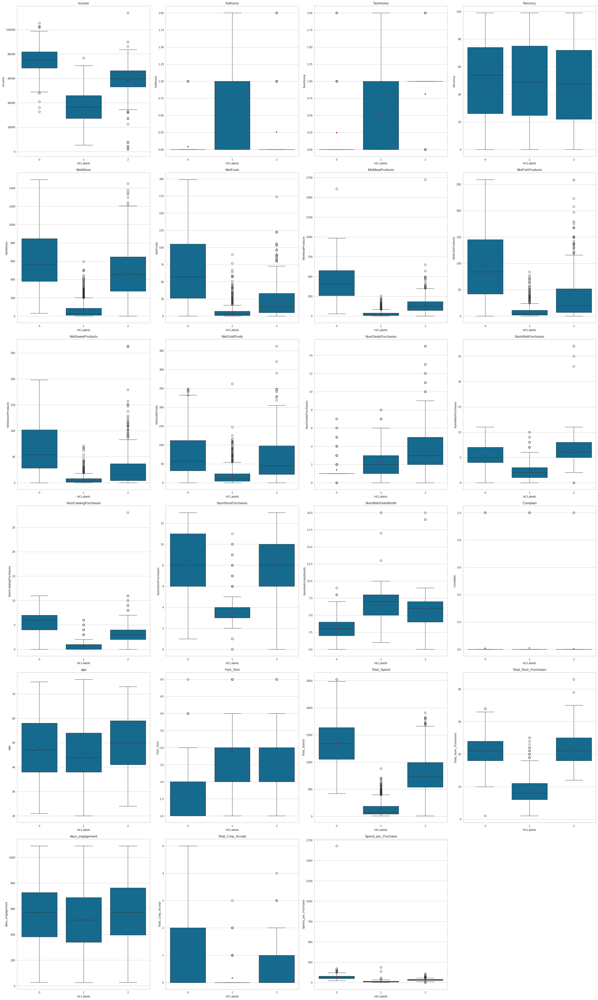

In [181]:
# Creating boxplot for each of the variables
all_col = col_plot
plt.figure(figsize = (30, 50))
for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)
    sns.boxplot(y=df[variable], x=df['HCLabels'],showmeans=True)
    plt.tight_layout()
    plt.title(variable)
plt.show()

In [182]:
#remove labels
df_pca.drop(columns="HCLabels", inplace=True)

In [183]:
#remove labels
df.drop(columns="HCLabels", inplace=True)

**Observations and Insights:**
* There are 3 distinct clusters. The silhouette score is 0.2561. The calinski harabasz score is 733.00.

### **Characteristics of each cluster**


**Summary of each cluster:**
*  Cluster 0 has the highest income (50,000-100,000, median of 75,000, mean of 75,000), the lowest amount of kids and teens at home. This group spends the most on products, buys the least amount of deals, has a medium amount of web purchases, the highest amount of catalog and store purchases, and the lowest web visits per month. This group is medium in age (median of 47), with the lowest family size (median of 2). They had the highest total spend, 2nd highest number of purchases, highest campaign acceptance, and the highest spend per purchase.
* Cluster 1 has the lowest income (5,000-70,000, median of 36,000, mean of 36,000), the most amount of kids at home, and a medium amount of teens at home. This group spends the least on products, buys a medium amount of deals, has the lowest amount of web, catalog, and store purchases, and the highest amount of web visits per month. They are youngest in age (median of 44), with the highest family size (median of 3). They had the lowest total spend, number of purchases, campaign acceptance, and spend per purchase.
* Cluster 2 has a medium income (35,000-85,000, median of 60,000, mean of 59,000 ), with a medium amount of kids at home and the highest amount of kids at home. This group is medium on spending on products, buys the most amount of deals and web purchases, has a medium amount of catalog and store purchases, and a medium amount of web visits per month. They are oldest in age (median of 50), with a medium family size of 2.75(median).  They have a medium total spend, the highest amount of total purchases, a medium amount of campaign acceptance, and a medium amount of spend per purchase.


## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

In [184]:
# Initializing lists
eps_value = [2,3]                       # Taking random eps value
min_sample_values = [6,20]              # Taking random min_sample value
# Creating a dictionary for each value in eps_value with min_sample_values
res = {eps_value[i]: min_sample_values for i in range(len(eps_value))}

In [185]:
# Finding silhouette score for each combination
high_silhouette_avg = 0                                               # Assigning 0 to the high_silhouette_avg variable
high_i_j = [0, 0]                                                     # Assigning 0's to the high_i_j list
key = res.keys()                                                      # Assigning dictionary keys to variable key
for i in key:
    z = res[i]                                                        # Assigning dictionary values of each i to z
    for j in z:
        db = DBSCAN(eps=i, min_samples=j).fit(df_pca)               # Applying DBSCAN to each combination in dictionary
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        silhouette_avg = silhouette_score(df_pca, labels)           # Finding silhouette score
        print(
            "For eps value =" + str(i),
            "For min sample =" + str(j),
            "The average silhoutte_score is :",
            silhouette_avg,                                          # Printing silhouette score for each combination
        )
        if high_silhouette_avg < silhouette_avg:                     # If silhouette score is greater than 0 or the previous score, it will get appended to the high_silhouette_avg list with its combination of i and j
            high_i_j[0] = i
            high_i_j[1] = j

For eps value =2 For min sample =6 The average silhoutte_score is : 0.022599155066450813
For eps value =2 For min sample =20 The average silhoutte_score is : 0.27714578686485825
For eps value =3 For min sample =6 The average silhoutte_score is : 0.1782737853597739
For eps value =3 For min sample =20 The average silhoutte_score is : 0.31219221079747606


In [186]:
# Print highest silhouette score
print("Highest_silhoutte_avg is {} for eps = {} and min sample = {}".format(high_silhouette_avg, high_i_j[0], high_i_j[1]))

Highest_silhoutte_avg is 0 for eps = 3 and min sample = 20


### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

In [187]:
# Apply DBSCAN using determined hyperparameter values
dbscan = DBSCAN(eps=3, min_samples=20)

In [188]:
#fit and predict to df_pca
labels=dbscan.fit_predict(df_pca)

In [189]:
# fit_predict on data_pca and add DBSCAN cluster labels
df_pca["DBSCAN"]=dbscan.labels_

In [190]:
#apply labels to df
df["DBSCAN"]=dbscan.labels_

In [191]:
#apply labels to df_seg
df_seg["DBSCAN"]=dbscan.labels_

In [192]:
#distribution
df_seg["DBSCAN"].value_counts()

 0    1696
-1     531
Name: DBSCAN, dtype: int64

In [193]:
#silhouette score
DB_sil_score=silhouette_score(df_pca, df_pca['DBSCAN'])
print(DB_sil_score)

0.31868087901137954


In [194]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["DBSCAN"]))

684.909318753585


In [195]:
#define PCA plot
def PCA_PLOT5(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster, palette="tab10")

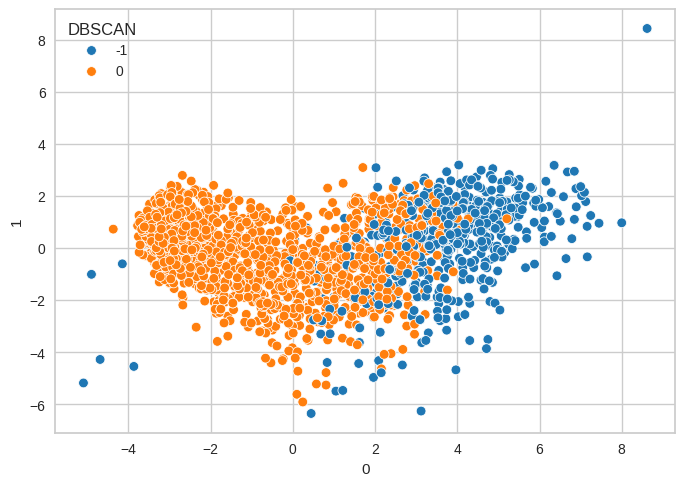

In [196]:
#plot dbscan clusters
PCA_PLOT5(0, 1, df_pca, "DBSCAN")

In [197]:
#dataframe with mean and median values
mean=df_seg.groupby("DBSCAN").mean()
median=df_seg.groupby("DBSCAN").median()
df_dbscan=pd.concat([mean, median], axis=0)
df_dbscan.index=["Group0 Mean", "Group1 Mean", "Group0 Median", "Group1 Median"]
df_dbscan

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo,HCLabels
Group0 Mean,73170.734463,49.853107,654.290019,68.139360,424.653484,95.013183,70.713748,88.60452,1.977401,5.662900,...,2.003766,1401.414313,21.629002,583.502825,1.186441,71.397211,1.630885,1.403013,3.514124,0.340866
Group1 Mean,44927.037736,48.885613,195.987028,13.294222,84.271816,19.724057,13.557783,30.23408,2.429835,3.615566,...,2.783019,357.068986,12.770047,524.034198,0.217571,21.338373,0.767099,1.168632,1.671580,1.117335
Group0 Median,75251.000000,52.000000,612.000000,53.000000,397.000000,76.000000,55.000000,67.00000,1.000000,5.000000,...,2.000000,1410.000000,21.000000,612.000000,1.000000,66.428571,2.000000,1.000000,4.000000,0.000000
Group1 Median,44157.000000,49.000000,76.000000,4.000000,31.000000,7.000000,5.000000,17.00000,2.000000,3.000000,...,3.000000,174.000000,11.000000,520.500000,0.000000,16.500000,1.000000,0.000000,2.000000,1.000000


In [198]:
#max avg values
df_dbscan.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo,HCLabels
Group0 Mean,73170.734463,49.853107,654.290019,68.139360,424.653484,95.013183,70.713748,88.604520,1.977401,5.662900,5.779661,8.209040,3.774011,47.870056,2.003766,1401.414313,21.629002,583.502825,1.186441,71.397211,1.630885,1.403013,3.514124,0.340866
Group1 Mean,44927.037736,48.885613,195.987028,13.294222,84.271816,19.724057,13.557783,30.234080,2.429835,3.615566,1.655660,5.068986,5.812500,46.873821,2.783019,357.068986,12.770047,524.034198,0.217571,21.338373,0.767099,1.168632,1.671580,1.117335
Group0 Median,75251.000000,52.000000,612.000000,53.000000,397.000000,76.000000,55.000000,67.000000,1.000000,5.000000,6.000000,8.000000,3.000000,47.000000,2.000000,1410.000000,21.000000,612.000000,1.000000,66.428571,2.000000,1.000000,4.000000,0.000000
Group1 Median,44157.000000,49.000000,76.000000,4.000000,31.000000,7.000000,5.000000,17.000000,2.000000,3.000000,1.000000,4.000000,6.000000,46.000000,3.000000,174.000000,11.000000,520.500000,0.000000,16.500000,1.000000,0.000000,2.000000,1.000000


In [199]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

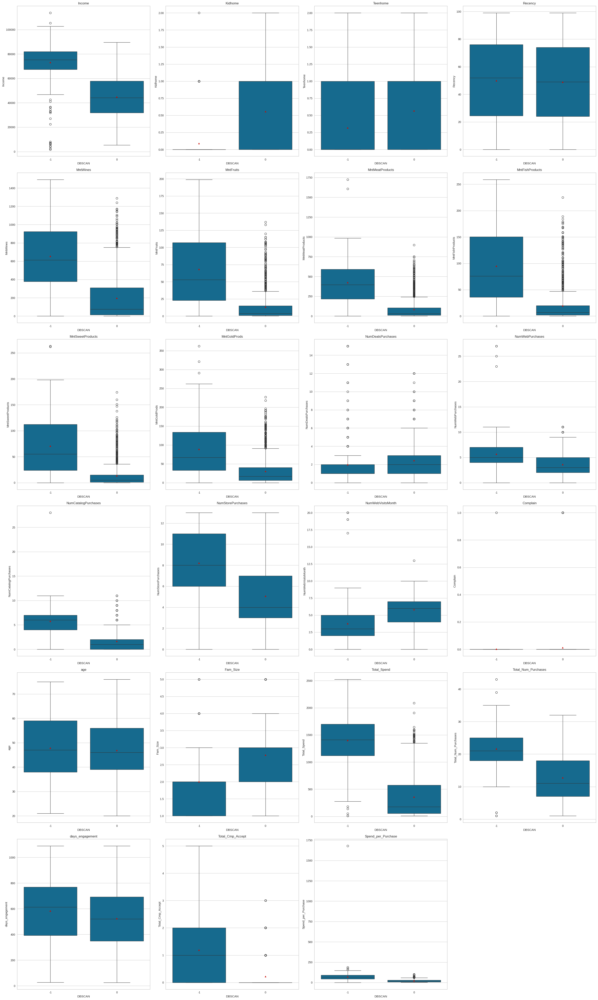

In [200]:
# Creating boxplot for each variable
all_col = col_plot
plt.figure(figsize = (30, 50))
for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)
    sns.boxplot(y=df[variable], x=df['DBSCAN'],showmeans=True)
    plt.tight_layout()
    plt.title(variable)
plt.show()

In [201]:
#drop labels
df_pca.drop(columns="DBSCAN", inplace=True)

In [202]:
#drop labels
df.drop(columns="DBSCAN", inplace=True)

**Observations and Insights:**
* There are 2 clusters that have emerged, but there is a high amount of overlap in the clusters. The silhouette score is 0.3186. The calinski harabasz score is 684.90.

**Think about it:**

- Changing the eps and min sample values will result in different DBSCAN results? Can we try more value for eps and min_sample?

### **Characteristics of each cluster**

**Summary of each cluster:**
* Cluster 0 has a higher income (50,000-105,000, median of 75,000, mean of 73,000), less kids and teens at home, buys more products, buys less deals, buys more web, catalog, and store purchases, has less web visits per month, is slightly older, has a smaller family size, has a higher total spend, number of purchases, campaign acceptance and spend per purchase.
* Cluster 1 has a lower income (5,000-90,000, median of 44,000, mean of 45,000), more kids and teens at home, buys less products, buys more deals, buys more web, catalog, and store purchases, has more web visits per month, is slightly younger, has a larger family size, has a lower total spend, number of purchases, campaign acceptance and spend per purchase.


## **Gaussian Mixture Model**

In [203]:
#define gmm
gmm=GaussianMixture(n_components=5, random_state=1)

In [204]:
#fit and predict to df_pca
labels=gmm.fit_predict(df_pca)

In [205]:
#silhouette score
Sil_Score=silhouette_score(df_pca, labels)
print(Sil_Score)

0.11915127334912898


In [206]:
gmm.fit(df_pca)

GaussianMixture(n_components=5, random_state=1)

In [207]:
#apply labels to df
df["gmmLabels"]=gmm.predict(df_pca)

In [208]:
#apply labels to df_seg
df_seg["gmmLabels"]=gmm.predict(df_pca)

In [209]:
#apply labels to df_pca
df_pca["gmmLabels"]=gmm.predict(df_pca)

In [210]:
#distribution
df_seg["gmmLabels"].value_counts()

1    731
4    585
3    452
0    395
2     64
Name: gmmLabels, dtype: int64

In [211]:
#silhouette score
gmm_sil_score=silhouette_score(df_pca, df_pca['gmmLabels'])
print(gmm_sil_score)

0.25219648333825767


In [212]:
print(metrics.calinski_harabasz_score(df_pca, df_pca["gmmLabels"]))

500.26585315305886


**Observations and Insights:**
* The silhouette score is 0.2521. The calinski harabasz score is 500.26.

### **Visualize the clusters using PCA**

In [213]:
#define pca plt
def PCA_PLOT6(X, Y, PCA, cluster):
    sns.scatterplot(x=X, y=1, data=PCA, hue=cluster, palette="tab10")

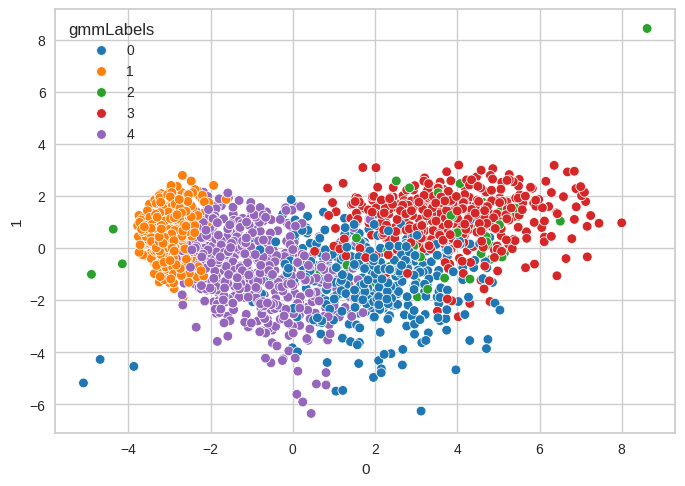

In [214]:
#plot clusters
PCA_PLOT6(0, 1, df_pca, "gmmLabels")

### **Cluster Profiling**

In [215]:
#dataframe with means and medians
mean=df_seg.groupby("gmmLabels").mean()
median=df_seg.groupby("gmmLabels").median()
df_gmm=pd.concat([mean, median], axis=0)
df_gmm.index=["Group0 Mean", "Group1 Mean", "Group2 Mean", "Group3 Mean", "Group4 Mean", "Group0 Median", "Group1 Median", "Group2 Median", "Group3 Median", "Group4 Median"]
df_gmm

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo,HCLabels,DBSCAN
Group0 Mean,60920.658228,46.050633,508.693671,47.151899,196.035443,60.113924,47.643038,73.108861,3.331646,6.577215,...,932.746835,23.207595,627.898734,0.354430,39.972382,0.473418,2.215190,2.637975,1.293671,-0.364557
Group1 Mean,31740.920657,48.544460,18.436389,3.012312,12.333789,4.658003,3.276334,10.062927,1.766074,1.608755,...,51.779754,6.532148,485.015048,0.157319,7.722700,1.000000,0.005472,0.559508,1.000000,0.000000
Group2 Mean,71583.765625,48.984375,838.812500,45.203125,334.187500,59.468750,42.703125,74.281250,1.453125,4.406250,...,1394.656250,16.765625,634.812500,2.531250,112.966271,1.593750,1.125000,3.093750,0.281250,-0.953125
Group3 Mean,76744.842920,51.075221,618.825221,65.035398,489.570796,100.092920,69.190265,78.446903,1.121681,4.995575,...,1421.161504,20.115044,516.860619,0.935841,71.867601,1.907080,1.172566,3.714602,0.112832,-0.716814
Group4 Mean,48741.218803,50.401709,225.671795,9.594872,67.165812,13.172650,9.097436,37.401709,3.357265,4.829060,...,362.104274,15.446154,550.063248,0.271795,22.142594,0.487179,2.129915,2.347009,1.307692,-0.003419
Group0 Median,62670.000000,46.000000,466.000000,35.000000,179.000000,49.000000,37.000000,54.000000,3.000000,6.000000,...,939.000000,23.000000,649.000000,0.000000,37.480000,0.000000,2.000000,2.000000,2.000000,0.000000
Group1 Median,31590.000000,49.000000,13.000000,2.000000,11.000000,3.000000,2.000000,7.000000,1.000000,1.000000,...,48.000000,6.000000,473.000000,0.000000,7.428571,1.000000,0.000000,0.000000,1.000000,0.000000
Group2 Median,77949.000000,56.000000,974.000000,28.000000,299.000000,39.500000,26.500000,48.500000,1.000000,4.000000,...,1569.000000,17.000000,630.000000,3.000000,99.828431,2.000000,1.000000,4.000000,0.000000,-1.000000
Group3 Median,76996.500000,54.000000,572.000000,51.000000,455.000000,84.500000,54.500000,55.500000,1.000000,5.000000,...,1382.000000,20.000000,509.000000,1.000000,67.955357,2.000000,1.000000,4.000000,0.000000,-1.000000
Group4 Median,49269.000000,51.000000,175.000000,6.000000,59.000000,8.000000,6.000000,26.000000,3.000000,4.000000,...,315.000000,15.000000,553.000000,0.000000,21.363636,0.000000,2.000000,3.000000,1.000000,0.000000


In [216]:
#max avg values
df_gmm.style.highlight_max(color="lightblue", axis=0)

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,Fam_Size,Total_Spend,Total_Num_Purchases,days_engagement,Total_Cmp_Accept,Spend_per_Purchase,kmeans_3seg,kmeans_5seg,kmedo,HCLabels,DBSCAN
Group0 Mean,60920.658228,46.050633,508.693671,47.151899,196.035443,60.113924,47.643038,73.108861,3.331646,6.577215,4.232911,9.065823,5.518987,49.491139,2.572152,932.746835,23.207595,627.898734,0.354430,39.972382,0.473418,2.215190,2.637975,1.293671,-0.364557
Group1 Mean,31740.920657,48.544460,18.436389,3.012312,12.333789,4.658003,3.276334,10.062927,1.766074,1.608755,0.298222,2.859097,6.428181,43.749658,2.946648,51.779754,6.532148,485.015048,0.157319,7.722700,1.000000,0.005472,0.559508,1.000000,0.000000
Group2 Mean,71583.765625,48.984375,838.812500,45.203125,334.187500,59.468750,42.703125,74.281250,1.453125,4.406250,4.531250,6.375000,5.921875,46.390625,2.156250,1394.656250,16.765625,634.812500,2.531250,112.966271,1.593750,1.125000,3.093750,0.281250,-0.953125
Group3 Mean,76744.842920,51.075221,618.825221,65.035398,489.570796,100.092920,69.190265,78.446903,1.121681,4.995575,6.015487,7.982301,2.329646,47.951327,1.767699,1421.161504,20.115044,516.860619,0.935841,71.867601,1.907080,1.172566,3.714602,0.112832,-0.716814
Group4 Mean,48741.218803,50.401709,225.671795,9.594872,67.165812,13.172650,9.097436,37.401709,3.357265,4.829060,1.671795,5.588034,6.070085,49.135043,2.866667,362.104274,15.446154,550.063248,0.271795,22.142594,0.487179,2.129915,2.347009,1.307692,-0.003419
Group0 Median,62670.000000,46.000000,466.000000,35.000000,179.000000,49.000000,37.000000,54.000000,3.000000,6.000000,4.000000,10.000000,6.000000,49.000000,3.000000,939.000000,23.000000,649.000000,0.000000,37.480000,0.000000,2.000000,2.000000,2.000000,0.000000
Group1 Median,31590.000000,49.000000,13.000000,2.000000,11.000000,3.000000,2.000000,7.000000,1.000000,1.000000,0.000000,3.000000,7.000000,43.000000,3.000000,48.000000,6.000000,473.000000,0.000000,7.428571,1.000000,0.000000,0.000000,1.000000,0.000000
Group2 Median,77949.000000,56.000000,974.000000,28.000000,299.000000,39.500000,26.500000,48.500000,1.000000,4.000000,4.000000,6.000000,6.000000,46.000000,2.000000,1569.000000,17.000000,630.000000,3.000000,99.828431,2.000000,1.000000,4.000000,0.000000,-1.000000
Group3 Median,76996.500000,54.000000,572.000000,51.000000,455.000000,84.500000,54.500000,55.500000,1.000000,5.000000,6.000000,8.000000,2.000000,47.000000,2.000000,1382.000000,20.000000,509.000000,1.000000,67.955357,2.000000,1.000000,4.000000,0.000000,-1.000000
Group4 Median,49269.000000,51.000000,175.000000,6.000000,59.000000,8.000000,6.000000,26.000000,3.000000,4.000000,1.000000,5.000000,6.000000,48.000000,3.000000,315.000000,15.000000,553.000000,0.000000,21.363636,0.000000,2.000000,3.000000,1.000000,0.000000


In [217]:
# Columns for boxplot
col_plot = ['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','Complain','age','Fam_Size','Total_Spend','Total_Num_Purchases','days_engagement','Total_Cmp_Accept','Spend_per_Purchase']

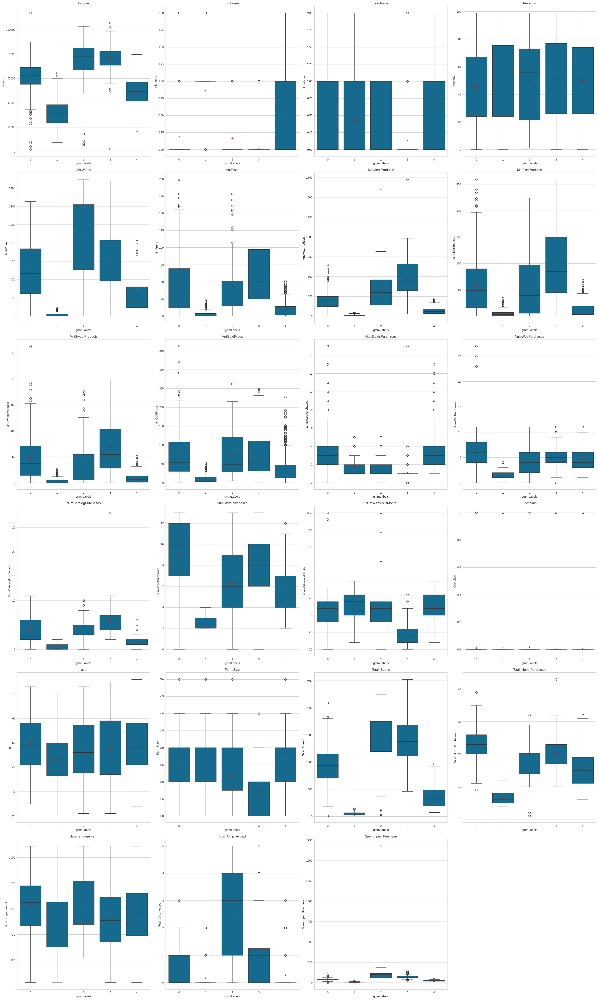

In [218]:
# Creating boxplot for each variable
all_col = col_plot
plt.figure(figsize = (30, 50))
for i, variable in enumerate(all_col):
    plt.subplot(6, 4, i + 1)
    sns.boxplot(y=df[variable], x=df['gmmLabels'],showmeans=True)
    plt.tight_layout()
    plt.title(variable)
plt.show()

**Observations and Insights:**
* Group 2 and 3 are highly overlapped and clustering is messy.Each group has overlap with others.

### **Characteristics of each cluster**

**Summary of each cluster:**
* Group 0 has a medium income (35,000-90,000, median of 63,000, mean of 61,000), a medium amount of kids at home, the highest amount of teens at home, buys a medium amount of products, buys the most deals, buys the most web and store purchases, buys a medium amount of catalog purchases, and has a medium amount of web visits per month. This group is the oldest, has a medium family size, has a medium total spend, the highest number of purchases, a medium campaign acceptance and spend per purchase.
* Group 1 has the lowest income (10,000-60,000, median of 32,000, mean of 32,000), the highest amount of kids at home, a medium amount of teens at home, buys the lowest amount of products, buys a medium amount of deals, buys the least web, catalog and store purchases, and has the highest amount of web visits per month. This group is the youngest, has the largest family size, has the lowest total spend, number of purchases, campaign acceptance and spend per purchase.
* Group 2 has the 2nd highest income (50,000-105,000, median of 78,000, mean of 72,000), a medium amount of kids and teens at home, buys the highest amount of wine, buys the 2nd highest amount of other products, buys the 2nd lowest amount of deals, buys a medium amount of web and store purchases, buys the 2nd highest amount of catalog purchases, and has the 2nd highest amount of web visits per month. This group is medium in age, has the 2nd smallest family size, has the 2nd highest total spend, a medium number of purchases, the highest campaign acceptance and spend per purchase.
* Group 3 has the highest income (55,000-100,000, median of 77,000, mean of 77,000), the lowest amount of kids and teens at home, buys the 2nd highest amount of wine, buys the highest amount of other products, buys the least deals, buys the 2nd most web and store purchases, buys the most amount of catalog purchases, and has the lowest amount of web visits per month. This group is medium in age, has the smallest family size, has the highest total spend, the 2nd highest number of purchases, a the 2nd highest campaign acceptance and spend per purchase.
* Group 4 has a medium income (20,000-80,000, median of 49,000, mean of 49,000), the 2nd highest amount of kids at home, the highest amount of teens at home, buys the 2nd lowest amount of products, buys the most deals, buys a medium amount of web and store purchases, buys the 2nd lowest amount of catalog purchases, and has the 2nd highest amount of web visits per month. This group is the 2nd oldest, has the 2nd largest family size, has the 2nd lowest total spend, number of purchases, campaign acceptance and spend per purchase.




## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?
* Kmeans (3): The clusters are distinct and obvious, with not much overlap. The calinski harabasz score is 817.75. The silhouette score is 0.2396.
* Kmeans (5): The silhouette score is 0.1918. The calinski harabasz score is 586.34. Clustering was less clear than with 3 clusters, one group has only one data point. Not a preferred clustering method.
* Kmedoids: The silhouette score is 0.0773. The calinski harabasz score is 528.26. K-medoid clusters are fairly differentiated, however group 0 and group 1 have significant overlap.
* Hierarchical Clustering: There are 3 distinct clusters. The silhouette score is 0.2561. The calinski harabasz score is 733.00.
* DBSCAN: There are 2 clusters that have emerged, but there is a high amount of overlap in the clusters. The silhouette score is 0.3186. The calinski harabasz score is 684.90.
* GMM: The silhouette score is 0.2521. The calinski harabasz score is 500.26. Group 2 and 3 are highly overlapped and clustering is messy. Each group has overlap with others.
* Overall, the highest silhouette score is with DBSCAN, and the highest Calinski Harabasz score is with K-means with 3 clusters. The PCA plot looks the most clear for K-means with 3 clusters and Hierarchal clustering. Given these metrics, K-means with 3 clusters ranks as number 1 in 2 of the top 3 criteria. Therefore, analysis is most accurate with this model.


 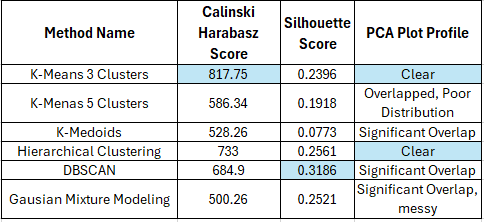



**2. Refined insights**:
- What are the most meaningful insights from the data relevant to the problem?
* **Insights:**
1. Cluster 0:
 - Income: Medium (30,000-85,000)
 - Age: Oldest (median of 51)
 - Family Size: Medium (median of 3)
 - Kids and Teens: Medium amount of kids, highest amount of teenagers
 - Product Purchases: Medium amount of each product
 - Deals: Highest amount of deals purchased (median of 3)
 - Purchases: Medium amount of web, catalog, and store purchases
 - Web Visits: Medium amount per month (median of 6)
 - Total Spend: Medium (mean of 723.94, median of 660)
  - Total Purchases: High
 - Campaign Acceptance: Medium
 - Spending per Purchase: Medium (mean of 22.95, median of 31.14)
2. Cluster 1:
 - Income: Low (0-70,000)
 - Age: Youngest (median of 43)
 - Family Size: Medium (median of 3)
 - Kids and Teens: Highest amount of kids and teens at home
 - Product Purchases: Lowest amount
 - Deals: Medium amount (median of 2)
 - Purchases: Lowest amount from catalog and in-store
 - Web Visits: Highest number per month (median of 7)
 - Total Spend: Low (mean of 96.82, median of 64)
 - Total Purchases: Lowest (median of 7)
 - Campaign Acceptance: Lowest
 - Spending per Purchase: Low (mean of 11.08, median of 9)
3.Cluster 2:
 - Income: High (50,000-100,000)
 - Age: Medium (median of 47)
 - Family Size: Lowest (median of 2)
 - Kids and Teens: Lowest amount at home
 - Product Purchases: Highest amount
 - Deals: Lowest amount (median of 1)
 - Purchases: Medium amount of web, highest amount of catalog and in-store
 - Web Visits: Lowest number per month (median of 2)
 - Total Spend: High (mean of 1403.72, median of 1376)
 - Total Purchases: High
 - Campaign Acceptance: Highest
 - Spending per Purchase: Highest (median of 67.07, mean of 72.97)
* **Offers and Strategies:**
1. Cluster 0:
 - Offers:
Target promotions for products that are commonly purchased.
Offer exclusive deals and discounts since this cluster has the highest amount of deal purchases.
Highlight products appealing to teenagers.
 - Strategies:
Focus on online marketing and web promotions due to a medium amount of web purchases.
Consider loyalty programs to encourage repeat purchases.
2. Cluster 1:
 - Offers:
Provide budget-friendly deals and discounts to align with their lower income.
Create family-oriented bundles to cater to the highest number of kids and teens at home.
Emphasize online promotions and web-exclusive deals.
 - Strategies:
Leverage online advertising and social media to reach the younger audience.
Implement time-limited promotions to capture attention during frequent web visits.
3. Cluster 2:
 - Offers:
Showcase premium products since this cluster has a high income.
Provide personalized catalog offers based on their high catalog and in-store purchases.
Introduce loyalty programs with exclusive perks for high spenders.
 - Strategies:
Emphasize in-store experiences and promotions to align with their high in-store purchases.
Invest in personalized marketing strategies based on their high spending and acceptance of campaigns.

**3. Proposal for the final solution design:**
- What model do you propose to be adopted? Why is this the best solution to adopt?
- The optimal model, as determined by diverse metrics, is the K-means clustering model configured with three clusters. This model stands out as the most suitable choice, given its superior performance, as evidenced by the highest Calinski Harabasz score and discernible clustering patterns evident on the Principal Component Analysis (PCA) graph. Additionally, the model exhibits a favorable distribution of data points, further underscoring its efficacy in capturing meaningful patterns within the dataset.